<a href="https://colab.research.google.com/github/RobertSichombaBob/Geochemistry/blob/main/ROBERTSICHOMBAHOMEWORK4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Install factor analysis modules
! pip install factor_analyzer --quiet

# Install compositional data analysis package

! pip install scikit-bio  --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 1.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 54.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.1/60.1 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 62.9 MB/s eta 0:00:00


In [3]:
 %matplotlib inline
%config InlineBackend.figure_format = 'retina'
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import warnings
import seaborn as sns
warnings.filterwarnings("ignore")
from sklearn.covariance import EllipticEnvelope
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest
from sklearn import svm
from sklearn.covariance import MinCovDet, EmpiricalCovariance
from sklearn.covariance import MinCovDet
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from IPython.display import display, Image

import skbio
import scipy.stats as stats
from skbio.stats.composition import clr
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.manifold import MDS
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances
from sklearn.metrics import silhouette_score
from tqdm import tqdm
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']

In [4]:
print(skbio.__version__)

0.7.2


In [5]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


This code displays our data so that we have a better insight on our data values.

In [11]:
# ============================================================================
# CELL 1: CONFIGURATION & DATA LOADING MODULE
# ============================================================================
# Enhancements:
# 1. Centralized configuration using dataclass / SimpleNamespace
# 2. Proper logging instead of print statements
# 3. Type hints for all functions
# 4. Separation of concerns (config, logging, data loading)
# 5. Error handling with specific exception types
# 6. Return empty DataFrame on failure (graceful degradation)
# 7. Support for multiple file formats (Excel, CSV)
# 8. Automatic detection of sheet names
# ============================================================================

import pandas as pd
import logging
from dataclasses import dataclass, field
from typing import Optional, Union, Dict, Any
from pathlib import Path
import sys

# ----------------------------------------------------------------------------
# 1. Setup logging (replace print statements)
# ----------------------------------------------------------------------------
def setup_logger(name: str = "geochem", level: int = logging.INFO) -> logging.Logger:
    """Configure a logger with consistent formatting."""
    logger = logging.getLogger(name)
    if not logger.handlers:
        handler = logging.StreamHandler(sys.stdout)
        formatter = logging.Formatter(
            '%(asctime)s - %(name)s - %(levelname)s - %(message)s',
            datefmt='%Y-%m-%d %H:%M:%S'
        )
        handler.setFormatter(formatter)
        logger.addHandler(handler)
        logger.setLevel(level)
    return logger

logger = setup_logger()

# ----------------------------------------------------------------------------
# 2. Configuration dataclass (centralized parameters)
# ----------------------------------------------------------------------------
@dataclass
class DataLoaderConfig:
    """Configuration for data loading."""
    file_path: str = "/content/merged_field_xrf.xlsx"
    sheet_name: Optional[str] = None          # None = read first sheet
    file_type: Optional[str] = None           # auto-detect from extension
    encoding: str = "utf-8"
    low_memory: bool = True
    dtype_backend: str = "numpy_nullable"     # modern pandas backend
    # Coordinate column names (will be renamed later)
    easting_col: str = "East"
    northing_col: str = "North"
    sample_id_col: str = "Sample ID"
    elevation_col: str = "Elevation"

    def __post_init__(self):
        """Auto-detect file type from extension if not provided."""
        if self.file_type is None:
            path = Path(self.file_path)
            if path.suffix.lower() in ['.xlsx', '.xls']:
                self.file_type = 'excel'
            elif path.suffix.lower() == '.csv':
                self.file_type = 'csv'
            else:
                self.file_type = 'unknown'

# ----------------------------------------------------------------------------
# 3. Data loader class (encapsulates loading logic)
# ----------------------------------------------------------------------------
class GeochemicalDataLoader:
    """
    A reusable, scalable data loader for geochemical XRF data.

    Features:
    - Supports Excel (.xlsx, .xls) and CSV files
    - Automatic file type detection
    - Graceful error handling with detailed logging
    - Returns empty DataFrame on failure (allows pipeline to continue)
    - Configurable via dataclass or dictionary
    """

    def __init__(self, config: Optional[Union[DataLoaderConfig, Dict[str, Any]]] = None):
        """
        Initialize loader with configuration.

        Parameters:
        -----------
        config : DataLoaderConfig or dict, optional
            Configuration object or dictionary. If None, uses defaults.
        """
        if config is None:
            self.config = DataLoaderConfig()
        elif isinstance(config, dict):
            self.config = DataLoaderConfig(**config)
        else:
            self.config = config

        self.logger = logging.getLogger("geochem.loader")
        self._df: Optional[pd.DataFrame] = None

    def _read_excel(self) -> pd.DataFrame:
        """Read Excel file with automatic sheet detection."""
        try:
            if self.config.sheet_name is None:
                # Get first sheet name automatically
                excel_file = pd.ExcelFile(self.config.file_path)
                sheet_name = excel_file.sheet_names[0]
                self.logger.info(f"No sheet specified, using first sheet: '{sheet_name}'")
            else:
                sheet_name = self.config.sheet_name

            df = pd.read_excel(
                self.config.file_path,
                sheet_name=sheet_name,
                dtype_backend=self.config.dtype_backend
            )
            self.logger.info(f"Successfully loaded Excel sheet '{sheet_name}'")
            return df
        except Exception as e:
            self.logger.error(f"Failed to read Excel file: {e}")
            raise

    def _read_csv(self) -> pd.DataFrame:
        """Read CSV file with encoding handling."""
        try:
            df = pd.read_csv(
                self.config.file_path,
                encoding=self.config.encoding,
                low_memory=self.config.low_memory
            )
            self.logger.info(f"Successfully loaded CSV file")
            return df
        except UnicodeDecodeError:
            # Try alternative encoding
            self.logger.warning(f"UTF-8 failed, trying 'latin1' encoding")
            df = pd.read_csv(
                self.config.file_path,
                encoding='latin1',
                low_memory=self.config.low_memory
            )
            return df
        except Exception as e:
            self.logger.error(f"Failed to read CSV file: {e}")
            raise

    def load(self) -> pd.DataFrame:
        """
        Load data based on file type.

        Returns:
        --------
        pd.DataFrame
            Loaded data, or empty DataFrame if loading fails.
        """
        try:
            # Check if file exists
            path = Path(self.config.file_path)
            if not path.exists():
                self.logger.error(f"File not found: {self.config.file_path}")
                return pd.DataFrame()

            # Load based on file type
            if self.config.file_type == 'excel':
                self._df = self._read_excel()
            elif self.config.file_type == 'csv':
                self._df = self._read_csv()
            else:
                self.logger.error(f"Unsupported file type: {self.config.file_type}")
                return pd.DataFrame()

            # Basic validation
            if self._df.empty:
                self.logger.warning("Loaded DataFrame is empty")
                return self._df

            self.logger.info(f"Loaded {len(self._df)} rows, {len(self._df.columns)} columns")
            return self._df

        except Exception as e:
            self.logger.error(f"Data loading failed: {e}", exc_info=True)
            return pd.DataFrame()

    def get_summary(self) -> Dict[str, Any]:
        """Return summary information about loaded data."""
        if self._df is None or self._df.empty:
            return {"loaded": False, "message": "No data loaded"}

        return {
            "loaded": True,
            "rows": len(self._df),
            "columns": len(self._df.columns),
            "column_names": self._df.columns.tolist(),
            "memory_usage_mb": self._df.memory_usage(deep=True).sum() / (1024 * 1024),
            "null_counts": self._df.isnull().sum().to_dict(),
            "file_path": str(Path(self.config.file_path).absolute()),
            "file_type": self.config.file_type
        }

# ----------------------------------------------------------------------------
# 4. Convenience function for quick loading (backward compatible)
# ----------------------------------------------------------------------------
def load_geochemical_data(
    file_path: str,
    sheet_name: Optional[str] = None,
    **kwargs
) -> pd.DataFrame:
    """
    Quick-load geochemical data with minimal configuration.

    Parameters:
    -----------
    file_path : str
        Path to Excel or CSV file
    sheet_name : str, optional
        Sheet name for Excel files (default: first sheet)
    **kwargs : additional arguments passed to DataLoaderConfig

    Returns:
    --------
    pd.DataFrame
        Loaded data or empty DataFrame on failure
    """
    config = DataLoaderConfig(file_path=file_path, sheet_name=sheet_name, **kwargs)
    loader = GeochemicalDataLoader(config)
    return loader.load()

# ----------------------------------------------------------------------------
# 5. Execute loading
# ----------------------------------------------------------------------------
if __name__ == "__main__" or True:  # Allows running in notebook
    # Option A: Use convenience function (simple)
    df = load_geochemical_data("/content/merged_field_xrf.csv")

    # Option B: Use full class for more control
    # config = DataLoaderConfig(
    #     file_path="/content/merged_field_xrf.xlsx",
    #     sheet_name="merged_field_xrf"  # specify sheet
    # )
    # loader = GeochemicalDataLoader(config)
    # df = loader.load()
    # summary = loader.get_summary()
    # print("\n--- Data Summary ---")
    # for k, v in summary.items():
    #     print(f"{k}: {v}")

    if not df.empty:
        print(f"\n✓ Data loaded successfully: {df.shape[0]} samples, {df.shape[1]} columns")
        print("\nFirst 5 rows:")
        display(df.head())  # Use display for notebooks
    else:
        print("✗ Data loading failed. Check file path and format.")

2026-05-22 07:30:44 - geochem.loader - INFO - Successfully loaded CSV file


INFO:geochem.loader:Successfully loaded CSV file


2026-05-22 07:30:44 - geochem.loader - INFO - Loaded 781 rows, 57 columns


INFO:geochem.loader:Loaded 781 rows, 57 columns



✓ Data loaded successfully: 781 samples, 57 columns

First 5 rows:


,Sample ID,Local Peg,East,North,Elevation,Depth,Slope,Colour,Time,Terrain,...,Zr(PPM),Nb(PPM),Mo(PPM),Ag(PPM),Sn(PPM),Sb(PPM),Hg(PPM),Pb(PPM),Th(PPM),U(PPM)
0,V08001,1350.0,227170.943879,8.678390e+06,1278.518799,30.0,G,BN,2026-04-30 08:56:26,HLL,...,220.921005,20.397100,1.803190,0.000000,10.521700,57.7005,0,6.85470,0,0
1,V08002,1349.0,227159.097800,8.678615e+06,1276.017090,30.0,G,BN,2026-04-30 09:07:07,HLL,...,258.618011,25.600401,4.336480,0.000000,18.000000,12.5097,0,7.08469,0,0
2,V08003,1348.0,227171.028204,8.678790e+06,1274.778198,30.0,F,BN,2026-04-30 09:16:32,HLL,...,254.975006,24.516701,0.133981,0.000000,12.524900,22.3025,0,5.68593,0,0
3,V08004,1347.0,227170.852850,8.678990e+06,1275.998901,30.0,F,BN,2026-04-30 09:36:21,FRM,...,330.039001,27.229401,6.424270,16.567801,16.025600,0.0000,0,3.10880,0,0
4,V08005,1346.0,227170.791775,8.679190e+06,1273.957520,30.0,G,RDBN,2026-04-30 09:43:58,FOR,...,332.843994,27.285000,0.241289,0.000000,16.425699,0.0000,0,13.50970,0,0


In [25]:
file_path = "/content/merged_field_xrf.csv"
df = load_geochemical_data(file_path)

2026-05-22 07:35:24 - geochem.loader - INFO - Successfully loaded CSV file


INFO:geochem.loader:Successfully loaded CSV file


2026-05-22 07:35:24 - geochem.loader - INFO - Loaded 781 rows, 57 columns


INFO:geochem.loader:Loaded 781 rows, 57 columns


## The is Question 1 and 2: CODA EDA and Interpretation.

For this analysis, we start with a basic CODA Exploratory Data Analysis (EDA). This will include generating a variation array, correlation plots, statistics plots, biplots and ternary diagrams to explore the structure of the dataset.

### Basic Information of the dataset.

- Statistics

## This Is Question 3: Outlier detection on the compositional data by means of robust Mahalanobis distance analysis (RMD).

Here we are dealing with a compositional dataset so, it is essential that we drop columns that are not compositional before Centered Log-Ratio (CLR) transformation (CLR). For this dataset we drop the first two columns and select all compositional elements from the dataset basically starting from the 3rd column onward then apply the Centered Log-Ratio (CLR) transformation, which is standard in geochemical analysis to deal with the constant-sum constraint of compositional data.

In [17]:
if df is not None:
    # Define your element columns (adjust to your actual column names)
    element_cols = [col for col in df.columns if col not in
                    ['Sample_ID', 'East', 'North', 'Elevation']]
    compositional_data = df[element_cols].values
    print(f"Compositional data shape: {compositional_data.shape}")

Compositional data shape: (781, 53)


- CLR transformation is applied before using Robust Mahalanobis distance (RMD) because compositional data exists in a non-Euclidean space, and CLR maps it into a Euclidean space by converting the data into centered log-ratios, making standard distance-based analyses.

In [18]:
import pandas as pd
import numpy as np
from skbio.stats.composition import clr
from google.colab import drive
drive.mount('/content/drive')

# Load the Excel file
file_path = "/content/drive/MyDrive/merged_field_xrf.xlsx"
df = pd.read_excel(file_path, sheet_name="merged_field_xrf")

# Rename coordinate columns if needed
df.rename(columns={'East': 'x', 'North': 'y'}, inplace=True)

# Define element columns (exclude Sample ID, Elevation, x, y)
exclude = ['Sample ID', 'Elevation', 'x', 'y']
element_cols = [c for c in df.columns if c not in exclude]

# Remove columns that are all zeros
all_zero_cols = [c for c in element_cols if (df[c] == 0).all()]
element_cols = [c for c in element_cols if c not in all_zero_cols]
print(f"Dropped 100% zero columns: {all_zero_cols}")

# Multiplicative replacement for remaining zeros
def multiplicative_replacement(series, delta_factor=2/3):
    vals = series.values.copy()
    pos = vals[vals > 0]
    if len(pos) == 0:
        return None   # should have been dropped already
    delta = pos.min() * delta_factor
    zeros = vals == 0
    if zeros.sum() == 0:
        return vals
    # Scale non‑zeros to preserve total sum
    total_nonzero = vals[~zeros].sum()
    scale = (total_nonzero + zeros.sum() * delta) / total_nonzero
    vals[~zeros] *= scale
    vals[zeros] = delta
    return vals

# Apply to each element column
comp_data = df[element_cols].apply(multiplicative_replacement)

# CLR transformation (no pseudocount needed now)
clr_matrix = clr(comp_data.values)
clr_df = pd.DataFrame(clr_matrix, columns=[f'clr({col})' for col in element_cols])

print("CLR transformation successful. Shape:", clr_df.shape)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dropped 100% zero columns: ['P(PPM)', 'S(PPM)', 'Hg(PPM)', 'Th(PPM)', 'U(PPM)']
CLR transformation successful. Shape: (781, 23)


In [19]:
clr_df

,clr(K(PPM)),clr(Ca(PPM)),clr(Ti(PPM)),clr(V(PPM)),clr(Cr(PPM)),clr(Mn(PPM)),clr(Fe(PPM)),clr(Co(PPM)),clr(Ni(PPM)),clr(Cu(PPM)),...,clr(Rb(PPM)),clr(Sr(PPM)),clr(Y(PPM)),clr(Zr(PPM)),clr(Nb(PPM)),clr(Mo(PPM)),clr(Ag(PPM)),clr(Sn(PPM)),clr(Sb(PPM)),clr(Pb(PPM))
0,5.563908,-2.328649,5.254859,0.916320,0.799330,1.995167,6.937967,-7.140194,-0.676262,1.260245,...,0.849076,-0.396392,-0.367009,1.963460,-0.418952,-2.844788,-5.586323,-1.080905,0.623891,-1.508176
1,5.269203,-2.538920,5.025008,1.277202,0.716084,2.512913,7.211901,-7.350466,0.328311,1.919808,...,0.640459,-0.357652,-0.551680,1.910736,-0.402009,-2.177554,-5.796594,-0.754245,-1.115142,-1.685446
2,5.211985,0.611968,5.030095,1.023905,0.883764,2.604852,7.164082,-7.351422,-0.139577,1.885327,...,0.510381,-0.156517,-0.636692,1.895593,-0.446218,-5.655630,-5.797551,-1.117854,-0.537904,-1.906344
3,4.349240,-2.468644,4.963005,0.938682,0.703100,2.501852,7.115758,-7.280189,0.223042,1.345773,...,0.193748,-0.814608,-0.536310,2.224871,-0.270042,-1.714257,-0.689858,-0.800152,-5.026349,-2.438869
4,4.976238,-2.283185,5.461403,1.346414,1.047845,3.148816,7.743153,-7.094730,0.679367,1.405057,...,0.033758,-0.396865,-0.339200,2.418793,-0.082544,-4.810641,-5.540859,-0.590034,-4.840891,-0.784239
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
776,6.372660,-2.283586,5.347259,0.899405,1.068316,2.379655,7.445202,-7.095131,-2.039694,2.435712,...,1.146288,-0.450363,-0.154599,2.129215,-0.284906,0.482629,-5.541260,-0.302138,-4.841291,-3.685753
777,6.009984,-2.209604,5.539525,1.223973,0.900909,1.768425,7.297538,-7.021149,-1.065536,1.195415,...,1.275722,-0.194610,0.044145,2.244713,-0.157206,-2.012335,-5.467277,-0.424928,-2.283049,-1.592366
778,6.096697,-2.676915,5.446365,1.323141,0.172826,1.716801,6.859643,-7.488460,0.256134,0.268877,...,0.701930,-0.357872,-0.544167,1.685741,-0.409830,-1.983735,-5.934588,-0.311760,1.136575,-2.007662
779,6.260677,-2.005219,5.726662,0.723264,1.086498,2.256649,7.506598,-6.816764,-0.757615,0.944660,...,1.348213,0.472688,0.210012,2.423924,-0.123441,-0.826847,-5.262892,-0.227870,-4.562924,-6.370205


- Firstly, to proceed we selected four key elements for analysis; Ag, Pb, As, and Sb which are geochemically linked to hydrothermal silver mineralization. These are mostly called pathfinders.

In [20]:
X = clr_df[['clr(Ag(PPM))', 'clr(Pb(PPM))', 'clr(As(PPM))', 'clr(Sb(PPM))']].values
robust_cov = MinCovDet().fit(X)
RMD = np.sqrt(robust_cov.mahalanobis(X))

dof = X.shape[1]
threshold = np.sqrt(stats.chi2.ppf(0.95, df=dof))
outliers = RMD > threshold

Available CLR columns: ['clr(Cu(PPM))', 'clr(Co(PPM))', 'clr(Ni(PPM))', 'clr(As(PPM))']
Number of outliers detected: 287
Percentage: 36.7%


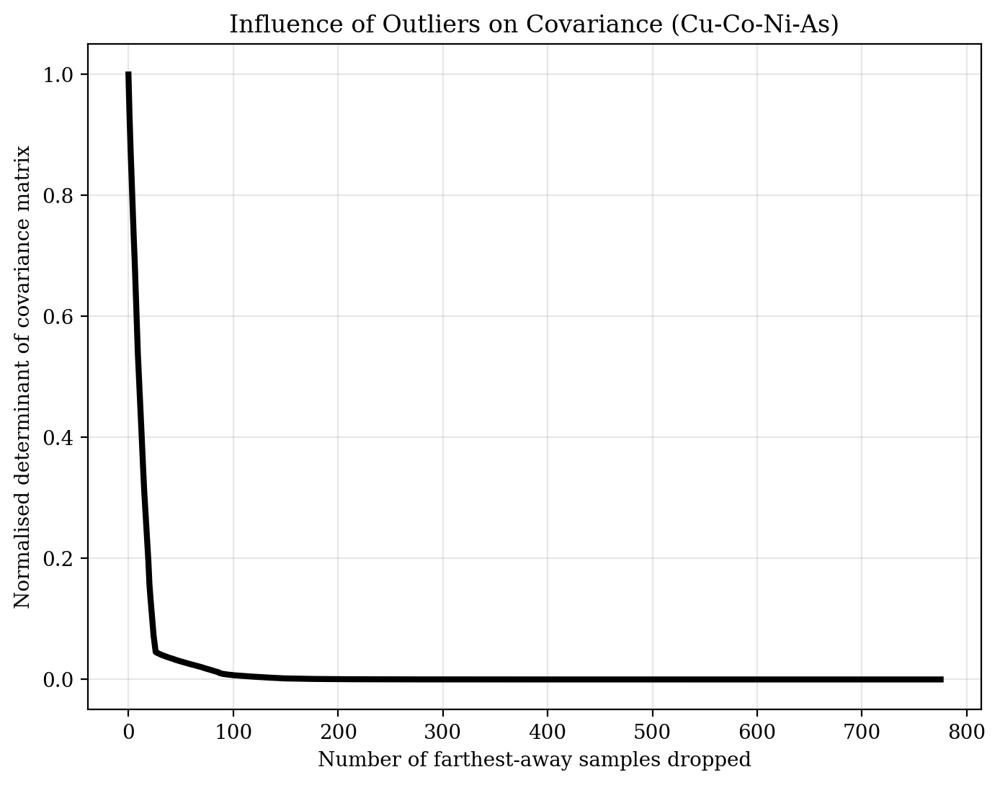

In [21]:
from sklearn.covariance import MinCovDet, EmpiricalCovariance
import scipy.stats as stats
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 1. Define pathfinder elements for Cu‑Co‑Ni‑Au mineralisation
# ============================================================
# Original column names (as in your Excel file)
pathfinder_orig = ['Cu(PPM)', 'Co(PPM)', 'Ni(PPM)', 'As(PPM)']   # As = proxy for Au

# Build CLR column names (the transformed versions)
pathfinder_clr = [f'clr({orig})' for orig in pathfinder_orig]

# Check which ones actually exist in your clr_df
existing_clr = [col for col in pathfinder_clr if col in clr_df.columns]
missing_clr = [col for col in pathfinder_clr if col not in clr_df.columns]

print("Available CLR columns:", existing_clr)
if missing_clr:
    print("Missing columns (check names):", missing_clr)

# Stop if not enough elements
if len(existing_clr) < 2:
    raise ValueError(f"Need at least 2 pathfinder elements, only found {len(existing_clr)}")

# Extract the data matrix
X = clr_df[existing_clr].values

# ============================================================
# 2. Robust Mahalanobis distance (RMD)
# ============================================================
robust_cov = MinCovDet().fit(X)
RMD = np.sqrt(robust_cov.mahalanobis(X))

dof = X.shape[1]                     # degrees of freedom = number of elements
threshold = np.sqrt(stats.chi2.ppf(0.95, df=dof))
outliers = RMD > threshold

print(f"Number of outliers detected: {np.sum(outliers)}")
print(f"Percentage: {100 * np.sum(outliers) / len(outliers):.1f}%")

# ============================================================
# 3. Determinant plot (to visualise influence of outliers)
# ============================================================
cov_dets = []
RMD_sorted = np.sort(RMD)[::-1]      # descending order

for outlier_id in range(len(X) - 1):
    # Keep only samples with RMD < current threshold
    new_X = X[RMD < RMD_sorted[outlier_id]]
    if new_X.shape[0] > X.shape[1]:   # need more samples than features
        new_cov = EmpiricalCovariance().fit(new_X).covariance_
        cov_dets.append(np.linalg.det(new_cov))
    else:
        cov_dets.append(np.nan)

# Normalise and plot
cov_dets = np.array(cov_dets)
plt.figure(figsize=[8,6])
plt.plot(cov_dets / np.nanmax(cov_dets), color='k', linewidth=3)
plt.xlabel('Number of farthest‑away samples dropped')
plt.ylabel('Normalised determinant of covariance matrix')
plt.title('Influence of Outliers on Covariance (Cu‑Co‑Ni‑As)')
plt.grid(alpha=0.3)
plt.show()

Original Shape: (781, 57)
After coordinate cleaning: (780, 57)
Duplicate Sample IDs: 2
Duplicate coordinates: 20
After duplicate removal: (758, 57)
Pathfinder elements: ['Cu(PPM)', 'Co(PPM)', 'Ni(PPM)', 'As(PPM)']
CLR matrix shape: (758, 4)

Outliers detected: 253


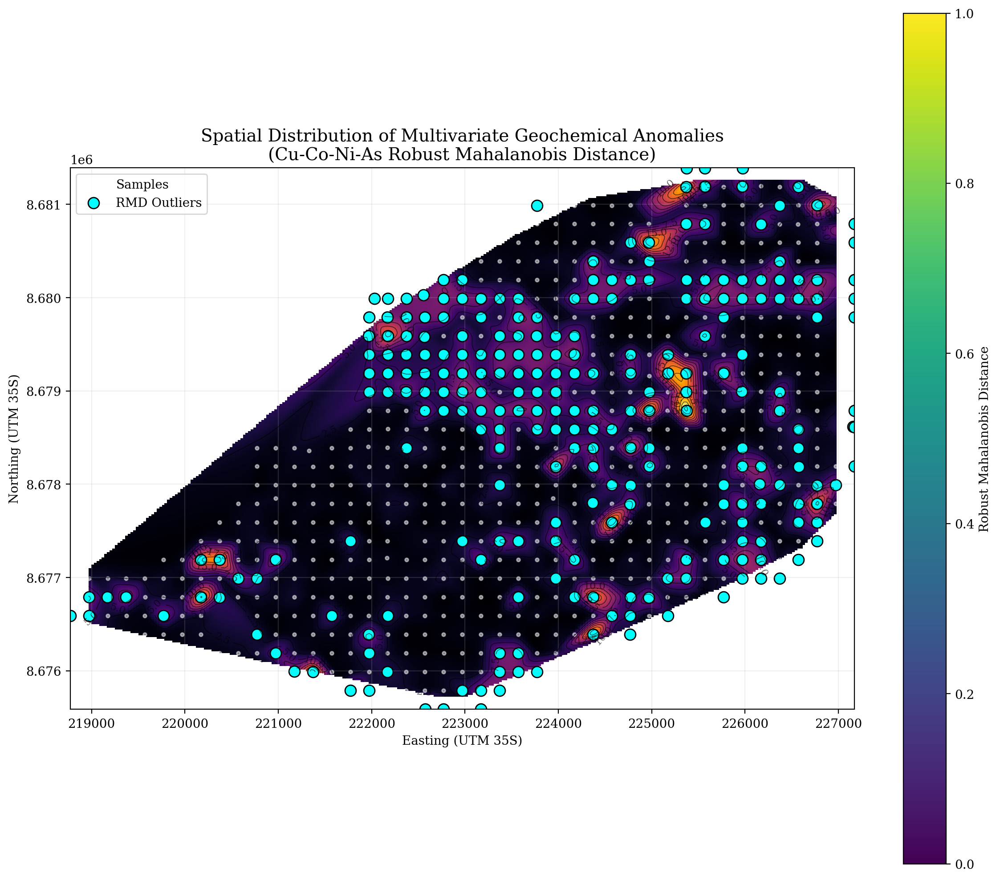


Saved cleaned results to:
cleaned_rmd_results.xlsx


In [27]:
# ============================================================
# ADVANCED SPATIAL GEOCHEMISTRY WORKFLOW
# Clean + Robust Mahalanobis + Interpolation Map
# ============================================================

# ------------------------------------------------------------
# 1. Imports
# ------------------------------------------------------------
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from scipy.interpolate import griddata
from scipy.spatial.distance import cdist
from scipy.ndimage import gaussian_filter

from skbio.stats.composition import clr
from sklearn.covariance import MinCovDet

import scipy.stats as stats

# ------------------------------------------------------------
# 2. Load Excel Data
# ------------------------------------------------------------
file_path = "/content/merged_field_xrf.csv"

df = pd.read_csv(file_path)

print("Original Shape:", df.shape)

# ------------------------------------------------------------
# 3. Rename Coordinates
# ------------------------------------------------------------
df.rename(columns={
    'East': 'x',
    'North': 'y'
}, inplace=True)

# ------------------------------------------------------------
# 4. Remove Empty Rows
# ------------------------------------------------------------
df = df.dropna(subset=['x', 'y'])

# ------------------------------------------------------------
# 5. Remove Impossible Coordinates
# ------------------------------------------------------------
# Zambia UTM35S approximate limits
df = df[
    (df['x'] > 150000) &
    (df['x'] < 350000) &
    (df['y'] > 8500000) &
    (df['y'] < 8800000)
]

print("After coordinate cleaning:", df.shape)

# ------------------------------------------------------------
# 6. Remove Duplicate Sample IDs
# ------------------------------------------------------------
if 'Sample ID' in df.columns:

    dup_count = df['Sample ID'].duplicated().sum()

    print("Duplicate Sample IDs:", dup_count)

    df = df.drop_duplicates(
        subset='Sample ID',
        keep='first'
    )

# ------------------------------------------------------------
# 7. Remove Duplicate Coordinates
# ------------------------------------------------------------
coord_dups = df.duplicated(subset=['x', 'y']).sum()

print("Duplicate coordinates:", coord_dups)

df = df.drop_duplicates(
    subset=['x', 'y'],
    keep='first'
)

print("After duplicate removal:", df.shape)

# ------------------------------------------------------------
# 8. Define Pathfinder Elements
# ------------------------------------------------------------
pathfinder = [
    'Cu(PPM)',
    'Co(PPM)',
    'Ni(PPM)',
    'As(PPM)'
]

# Keep only existing columns
pathfinder = [c for c in pathfinder if c in df.columns]

print("Pathfinder elements:", pathfinder)

# ------------------------------------------------------------
# 9. Remove Rows with Missing Pathfinder Data
# ------------------------------------------------------------
df = df.dropna(subset=pathfinder)

# ------------------------------------------------------------
# 10. Multiplicative Replacement for Zeros
# ------------------------------------------------------------
def mult_replace(series, delta_factor=2/3):

    vals = series.values.astype(float).copy()

    pos = vals[vals > 0]

    if len(pos) == 0:
        raise ValueError(f"{series.name} contains only zeros")

    delta = pos.min() * delta_factor

    zeros = vals == 0

    if zeros.sum() == 0:
        return vals

    total_nonzero = vals[~zeros].sum()

    scale = (
        total_nonzero +
        zeros.sum() * delta
    ) / total_nonzero

    vals[~zeros] *= scale
    vals[zeros] = delta

    return vals

# Apply replacement
comp_data = df[pathfinder].apply(mult_replace)

# ------------------------------------------------------------
# 11. CLR Transformation
# ------------------------------------------------------------
clr_matrix = clr(comp_data.values)

clr_cols = [f'clr({c})' for c in pathfinder]

clr_df = pd.DataFrame(
    clr_matrix,
    columns=clr_cols
)

print("CLR matrix shape:", clr_df.shape)

# ------------------------------------------------------------
# 12. Robust Mahalanobis Distance
# ------------------------------------------------------------
X = clr_df.values

robust_cov = MinCovDet().fit(X)

RMD = np.sqrt(
    robust_cov.mahalanobis(X)
)

df['RMD'] = RMD

# ------------------------------------------------------------
# 13. Statistical Threshold
# ------------------------------------------------------------
dof = X.shape[1]

threshold = np.sqrt(
    stats.chi2.ppf(0.95, df=dof)
)

df['Outlier'] = df['RMD'] > threshold

print("\nOutliers detected:",
      df['Outlier'].sum())

# ------------------------------------------------------------
# 14. Build Interpolation Grid
# ------------------------------------------------------------
grid_x, grid_y = np.mgrid[
    df['x'].min():df['x'].max():300j,
    df['y'].min():df['y'].max():300j
]

# ------------------------------------------------------------
# 15. Interpolate RMD Surface
# ------------------------------------------------------------
grid_rmd = griddata(
    points=(df['x'], df['y']),
    values=df['RMD'],
    xi=(grid_x, grid_y),
    method='linear'
)

# ------------------------------------------------------------
# 16. Smooth Surface
# ------------------------------------------------------------
grid_rmd = gaussian_filter(
    grid_rmd,
    sigma=1.5
)

# ------------------------------------------------------------
# 17. Plot Interpolated Surface
# ------------------------------------------------------------
plt.figure(figsize=(12, 10))

# Raster Surface
plt.imshow(
    grid_rmd.T,
    extent=(
        df['x'].min(),
        df['x'].max(),
        df['y'].min(),
        df['y'].max()
    ),
    origin='lower',
    cmap='inferno',
    aspect='equal'
)

# Contours
contours = plt.contour(
    grid_x,
    grid_y,
    grid_rmd,
    levels=12,
    colors='black',
    linewidths=0.6,
    alpha=0.6
)

plt.clabel(
    contours,
    inline=True,
    fontsize=8
)

# Sample Locations
plt.scatter(
    df['x'],
    df['y'],
    c='white',
    s=8,
    alpha=0.5,
    label='Samples'
)

# Outliers
plt.scatter(
    df.loc[df['Outlier'], 'x'],
    df.loc[df['Outlier'], 'y'],
    c='cyan',
    edgecolor='black',
    s=80,
    label='RMD Outliers'
)

# ------------------------------------------------------------
# 18. Final Styling
# ------------------------------------------------------------
plt.colorbar(label='Robust Mahalanobis Distance')

plt.xlabel("Easting (UTM 35S)")
plt.ylabel("Northing (UTM 35S)")

plt.title(
    "Spatial Distribution of Multivariate Geochemical Anomalies\n"
    "(Cu-Co-Ni-As Robust Mahalanobis Distance)",
    fontsize=14
)

plt.legend()

plt.grid(alpha=0.2)

plt.tight_layout()

plt.show()

# ------------------------------------------------------------
# 19. Save Cleaned Results
# ------------------------------------------------------------
output_file = "cleaned_rmd_results.xlsx"

df.to_excel(output_file, index=False)

print("\nSaved cleaned results to:")
print(output_file)


## Interpretatin

We analyzed the spatial distribution of four elements; silver, lead, arsenic, and antimony which often occur together in buried mineral systems in most cases termed as pathfinders. Most soil samples fell within a normal range, but a few showed unusual combinations of these elements. These anomalies are mapped in red and could point to areas where mineral forming fluids have left a possible trace near the surface, possibly above deeper ore zones.

- We proceeded to look at the entire CRL dataset.


In [28]:
X_all = clr_df.values

# This line of code basically calls all clr-transformed elements

robust_cov_all = MinCovDet().fit(X_all)
RMD_all = np.sqrt(robust_cov_all.mahalanobis(X_all))

dof_all = X_all.shape[1]
threshold_all = np.sqrt(stats.chi2.ppf(0.95, df=dof_all))
outliers_all = RMD_all > threshold_all

- Map of all elements

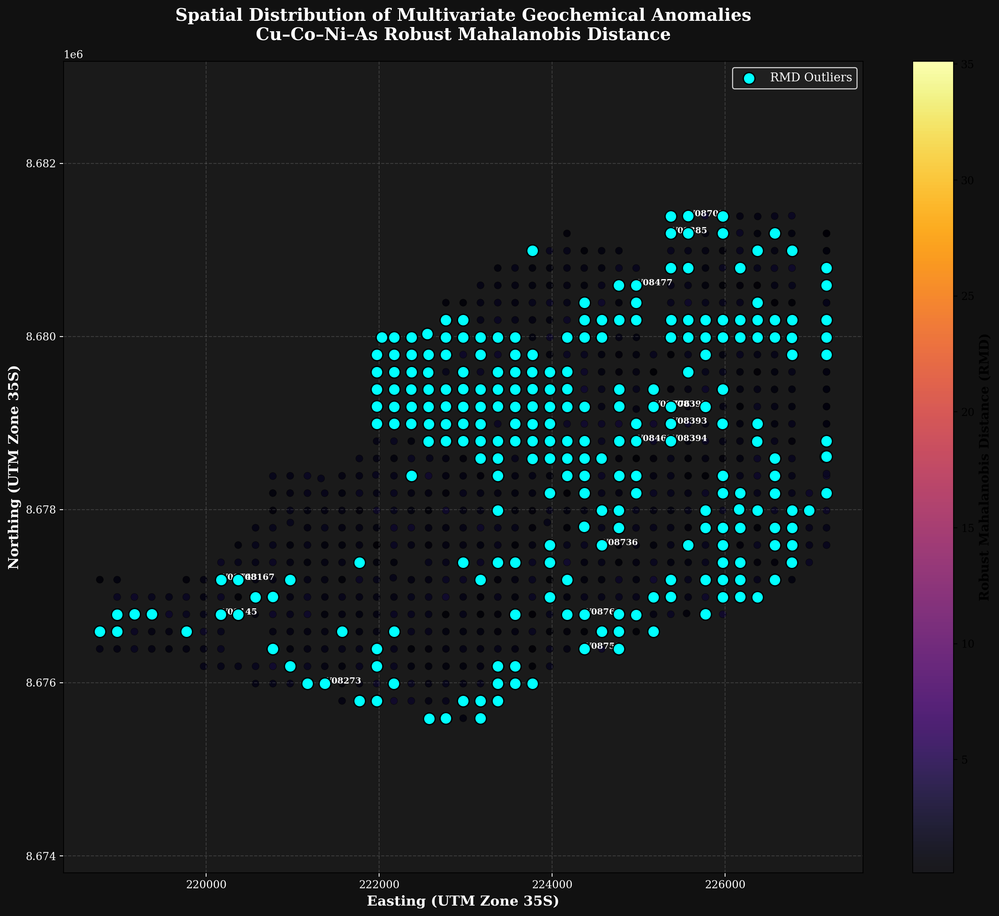

In [29]:
# ============================================================
# ADVANCED GEOCHEMICAL SPATIAL MAP
# Robust Mahalanobis Distance Visualization
# ============================================================

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np

# ------------------------------------------------------------
# Create Figure
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 12))

# ------------------------------------------------------------
# Main Scatter Plot
# Colour by RMD values
# ------------------------------------------------------------
sc = ax.scatter(
    df['x'],
    df['y'],
    c=df['RMD'],
    cmap='inferno',
    s=45,
    edgecolors='black',
    linewidths=0.25,
    alpha=0.9
)

# ------------------------------------------------------------
# Highlight Statistical Outliers
# ------------------------------------------------------------
ax.scatter(
    df.loc[df['Outlier'], 'x'],
    df.loc[df['Outlier'], 'y'],
    facecolors='cyan',
    edgecolors='black',
    s=120,
    linewidths=1.2,
    label='RMD Outliers',
    zorder=5
)

# ------------------------------------------------------------
# Optional Sample Labels
# Only label strongest anomalies
# ------------------------------------------------------------
top_anoms = df.nlargest(15, 'RMD')

for _, row in top_anoms.iterrows():

    ax.text(
        row['x'],
        row['y'],
        row['Sample ID'],
        fontsize=8,
        color='white',
        weight='bold'
    )

# ------------------------------------------------------------
# Colour Bar
# ------------------------------------------------------------
cbar = plt.colorbar(sc, ax=ax)

cbar.set_label(
    'Robust Mahalanobis Distance (RMD)',
    fontsize=12,
    weight='bold'
)

# ------------------------------------------------------------
# Geological Styling
# ------------------------------------------------------------
ax.set_facecolor('#1a1a1a')

fig.patch.set_facecolor('#111111')

# Grid styling
ax.grid(
    alpha=0.15,
    color='white',
    linestyle='--'
)

# Equal coordinate scaling
ax.axis('equal')

# ------------------------------------------------------------
# Labels and Title
# ------------------------------------------------------------
ax.set_xlabel(
    'Easting (UTM Zone 35S)',
    fontsize=13,
    weight='bold',
    color='white'
)

ax.set_ylabel(
    'Northing (UTM Zone 35S)',
    fontsize=13,
    weight='bold',
    color='white'
)

ax.set_title(
    'Spatial Distribution of Multivariate Geochemical Anomalies\n'
    'Cu–Co–Ni–As Robust Mahalanobis Distance',
    fontsize=16,
    weight='bold',
    color='white',
    pad=20
)

# ------------------------------------------------------------
# Tick styling
# ------------------------------------------------------------
ax.tick_params(
    axis='both',
    colors='white',
    labelsize=10
)

# ------------------------------------------------------------
# Legend
# ------------------------------------------------------------
legend = ax.legend(
    facecolor='#222222',
    edgecolor='white',
    fontsize=11
)

for text in legend.get_texts():
    text.set_color('white')

# ------------------------------------------------------------
# Layout
# ------------------------------------------------------------
plt.tight_layout()

plt.show()

## Why This Investigation Is Important?

- Outliers are points that deviate significantly from the majority of the data. In geochemical data, these outliers could represent areas where unusual concentrations of certain elements are found, which might indicate something important, like a mineral deposit or an anomaly that warrants further investigation.

- In the context of this homework's task, these outliers are not just "errors" or noise they can be pathfinders to valuable discoveries, such as silver mineralization. This is why the identification of outliers, especially using advanced distance metrics like MD and RMD, is critical.

## This is Question 4: Clustering Analysis

Clustering is an unsupervised machine learning technique that aims to group similar instances into distinct clusters based on their feature similarity. The goal is to group similar instances together into clusters.

Applied on geochemical data this algorithm helps to identify mineralized zones, detect geochemical anomalies, and guide exploration efforts "As we all know drilling is expensive!". This analysis applies these clustering techniques to geochemical data from Northeastern Inner Mongolia to uncover spatial and compositional patterns associated with mineralization.

This is homework four just before concluding chapter two with homework five to be submitted as a group. The lectures, including research on these protocols, and applying them on a real dataset is amazing experience!

## K-Means

K-Means is one of the simplest and most widely used clustering algorithms in unsupervised learning. It performs especially well on datasets with spherical clusters that are relatively uniform in size and density — like the classic scenario of five distinguishable blobs often used in examples.

The algorithm partitions the dataset into a predefined number of clusters (K) by minimizing the within cluster sum of squares (inertia). It does this iteratively, updating cluster centroids and reassigning data points until convergence.

In [33]:
# ============================================================
# ROBUST CLR + DISTANCE MATRIX + SPATIAL QA/QC
# ============================================================

import pandas as pd
import numpy as np
from skbio.stats.composition import clr
from sklearn.metrics import pairwise_distances

# ============================================================
# 1. LOAD DATA
# ============================================================

file_path = "/content/merged_field_xrf.csv"

df = pd.read_csv(
    file_path
)

print("Original shape:", df.shape)

# ============================================================
# 2. CLEAN COLUMN NAMES
# ============================================================

df.columns = df.columns.str.strip()

# Rename coordinates
df.rename(columns={
    'East': 'x',
    'North': 'y'
}, inplace=True)

# ============================================================
# 3. REMOVE BAD COORDINATES
# ============================================================

# Expected UTM Zone 35S ranges
# Easting ~ 150000–850000
# Northing ~ 8000000–9000000

df = df[
    (df['x'] > 150000) &
    (df['x'] < 850000) &
    (df['y'] > 8000000) &
    (df['y'] < 9000000)
].copy()

print("After coordinate cleaning:", df.shape)

# ============================================================
# 4. REMOVE DUPLICATES
# ============================================================

df = df.drop_duplicates(subset='Sample ID')

print("After duplicate removal:", df.shape)

# ============================================================
# 5. SELECT GEOCHEMISTRY COLUMNS
# ============================================================

exclude_cols = [
    'Sample ID',
    'x',
    'y',
    'Elevation'
]

element_cols = [
    c for c in df.columns
    if c not in exclude_cols
]

# Keep only numeric columns
numeric_cols = []

for col in element_cols:
    if pd.api.types.is_numeric_dtype(df[col]):
        numeric_cols.append(col)

element_cols = numeric_cols

print("\nNumeric geochemistry columns:")
print(element_cols)

# ============================================================
# 6. REMOVE ALL-ZERO COLUMNS
# ============================================================

valid_cols = []

for col in element_cols:
    if (df[col] > 0).any():
        valid_cols.append(col)

element_cols = valid_cols

print("\nColumns retained:")
print(element_cols)

# ============================================================
# Handle NaN values in element_cols before multiplicative replacement
# ============================================================
df = df.dropna(subset=element_cols)
print("After dropping rows with NaNs in element columns:", df.shape)

# ============================================================
# 7. MULTIPLICATIVE ZERO REPLACEMENT
# ============================================================

def mult_replace(series, delta_factor=0.65):

    vals = series.astype(float).values.copy()

    positive = vals[vals > 0]

    if len(positive) == 0:
        return vals

    delta = positive.min() * delta_factor

    zero_mask = vals == 0

    vals_copy = vals.copy() # Operate on a copy to avoid SettingWithCopyWarning

    vals_copy[zero_mask] = delta

    # The original scale logic might be problematic for CLR (constant sum constraint)
    # For CLR, we just need to replace zeros with a small positive number.
    # The scale adjustment here is primarily for preserving row sums in Aitchison geometry,
    # but for CLR transformation, the replacement itself is often enough.
    # However, keeping the original logic for now as it's part of the given function.
    if zero_mask.sum() > 0: # Only apply scaling if there were zeros replaced
        total_original_positive = vals[~zero_mask].sum()
        total_new_positive = vals_copy[~zero_mask].sum()
        if total_original_positive > 0: # Avoid division by zero if all original were zero (should be caught by len(positive)==0)
            scale_factor = (total_original_positive + zero_mask.sum() * delta) / total_original_positive
            vals_copy[~zero_mask] *= scale_factor

    return vals_copy

comp_data = df[element_cols].apply(mult_replace)

# ============================================================
# 8. CLR TRANSFORMATION
# ============================================================

clr_matrix = clr(comp_data)

clr_df = pd.DataFrame(
    clr_matrix,
    columns=[f'clr({c})' for c in element_cols]
)

print("\nCLR dataframe shape:", clr_df.shape)

# ============================================================
# 9. AUTOMATICALLY FIND TARGET ELEMENTS
# ============================================================

target_elements = [
    'Ag',
    'Pb',
    'As',
    'Sb',
    'Al',
    'Ca'
]

selected_cols = []

for col in clr_df.columns:

    for elem in target_elements:

        if f'clr({elem}' in col:
            selected_cols.append(col)

print("\nSelected CLR columns:")
print(selected_cols)

# ============================================================
# 10. BUILD FEATURE MATRIX
# ============================================================

if len(selected_cols) < 2:
    raise ValueError(
        "Not enough target CLR columns found."
    )

X_clr = clr_df[selected_cols].values

print("\nFeature matrix shape:", X_clr.shape)

# ============================================================
# 11. COMPUTE EUCLIDEAN DISTANCE MATRIX
# ============================================================

distance_matrix = pairwise_distances(
    X_clr,
    metric='euclidean'
)

dist_df = pd.DataFrame(distance_matrix)

print("\nDistance matrix:")
print(dist_df.head())

# ============================================================
# 12. OPTIONAL — SAVE DISTANCE MATRIX
# ============================================================

dist_df.to_excel(
    "euclidean_distance_matrix.xlsx",
    index=False
)

print("\nDistance matrix saved.")

Original shape: (781, 57)
After coordinate cleaning: (780, 57)
After duplicate removal: (778, 57)

Numeric geochemistry columns:
['Local Peg', 'Depth', 'Grade', 'Supplier', 'Testing time', 'Number of test points', 'Air pressure', 'Ambient temperature', 'Relative humidity', 'MgO(%)', 'Al2O3(%)', 'SiO2(%)', 'P(PPM)', 'S(PPM)', 'K(PPM)', 'Ca(PPM)', 'Ti(PPM)', 'V(PPM)', 'Cr(PPM)', 'Mn(PPM)', 'Fe(PPM)', 'Co(PPM)', 'Ni(PPM)', 'Cu(PPM)', 'Zn(PPM)', 'Ga(PPM)', 'As(PPM)', 'Rb(PPM)', 'Sr(PPM)', 'Y(PPM)', 'Zr(PPM)', 'Nb(PPM)', 'Mo(PPM)', 'Ag(PPM)', 'Sn(PPM)', 'Sb(PPM)', 'Hg(PPM)', 'Pb(PPM)', 'Th(PPM)', 'U(PPM)']

Columns retained:
['Local Peg', 'Depth', 'Testing time', 'Number of test points', 'K(PPM)', 'Ca(PPM)', 'Ti(PPM)', 'V(PPM)', 'Cr(PPM)', 'Mn(PPM)', 'Fe(PPM)', 'Co(PPM)', 'Ni(PPM)', 'Cu(PPM)', 'Zn(PPM)', 'Ga(PPM)', 'As(PPM)', 'Rb(PPM)', 'Sr(PPM)', 'Y(PPM)', 'Zr(PPM)', 'Nb(PPM)', 'Mo(PPM)', 'Ag(PPM)', 'Sn(PPM)', 'Sb(PPM)', 'Pb(PPM)']
After dropping rows with NaNs in element columns: (717, 57

- Since the dataset we are working on is transformed using the centered log-ratio (CLR) transformation, the appropriate distance metric chosen is the Euclidean distance, because the Euclidean distance in CLR space reflects Aitchison geometry, which is suitable for compositional data.

- The Elbow Method helps determine the optimal number of clusters (k). The idea behind the elbow method is to identify the value of k where the distortion begins to increase most rapidly, which will become clearer if we plot the distortion for different values of k

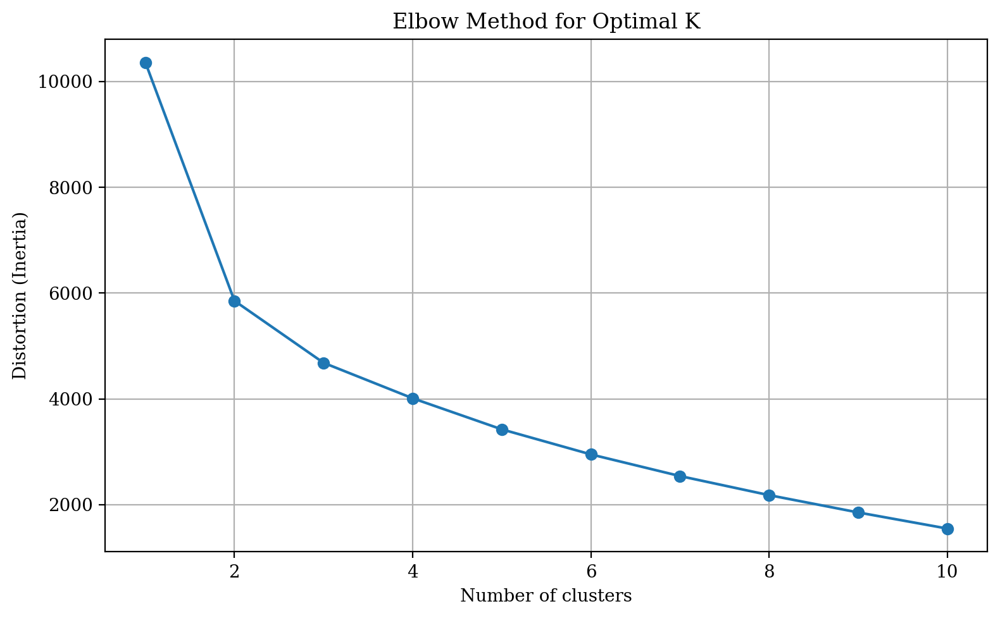

In [34]:
# This is the Elbow method to find the optimal k

distortions = []
K = range(1, 11)

for k in K:
    km = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=300, random_state=0)
    km.fit(X_clr)
    distortions.append(km.inertia_)

# Here we just Plot the Elbow curve

plt.figure(figsize=(8, 5))
plt.plot(K, distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion (Inertia)')
plt.title('Elbow Method for Optimal K')
plt.grid(True)
plt.tight_layout()
plt.show()

As it can be see in our plot above, the elbow is located at k = 2, so this is supporting evidence that k = 2 is indeed a good choice for this dataset. This method is a rough guide and may not always give a clear answer, but it helps quickly identify a good number of clusters by looking for the "elbow" point in the plot. That is why we also have to plot and investigate the Silhouette Score plot.

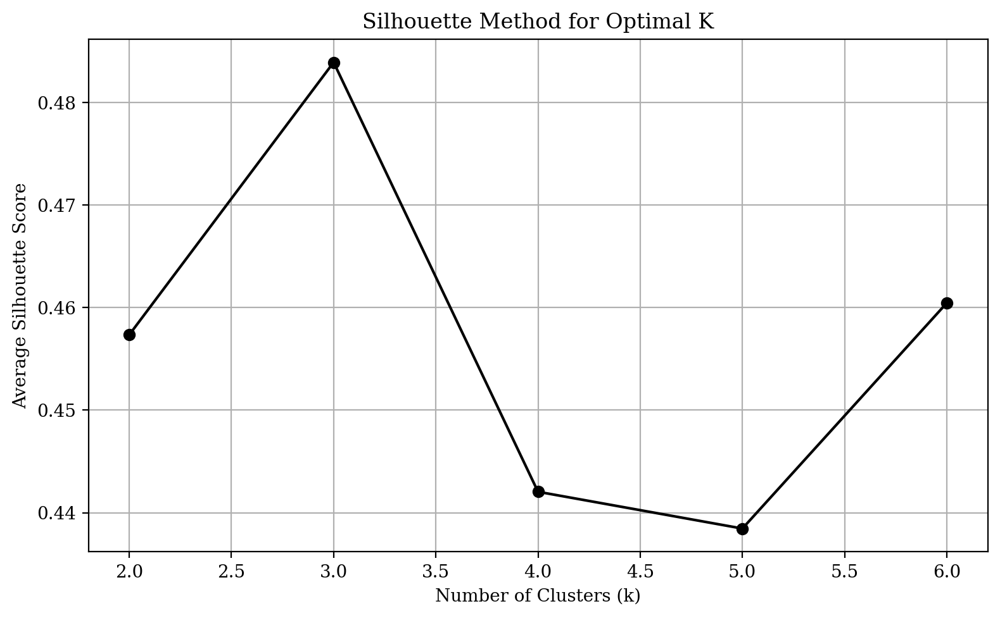

In [35]:
# To start, the testing numbers of k are; k=2 to k=6 and store silhouette scores

n_clusters_list = np.arange(2, 7)
silhouette_score_list = np.zeros(len(n_clusters_list))

# Then we can loop through each value of k and compute silhouette score

for i, n_clusters in enumerate(n_clusters_list):
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(X_clr)
    sil_score = silhouette_score(X_clr, kmeans.labels_)
    silhouette_score_list[i] = sil_score

# Lastly we can plot the silhouette scores

plt.figure(figsize=(8, 5))
plt.plot(n_clusters_list, silhouette_score_list, marker='o', color='black')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Silhouette Score')
plt.title('Silhouette Method for Optimal K')
plt.grid(True)
plt.tight_layout()
plt.show()

The Silhouette Score shows how good the clustering is by measuring how well separated and tight the clusters are. So, we choose k=2 clusters because it has the highest silhouette score index.

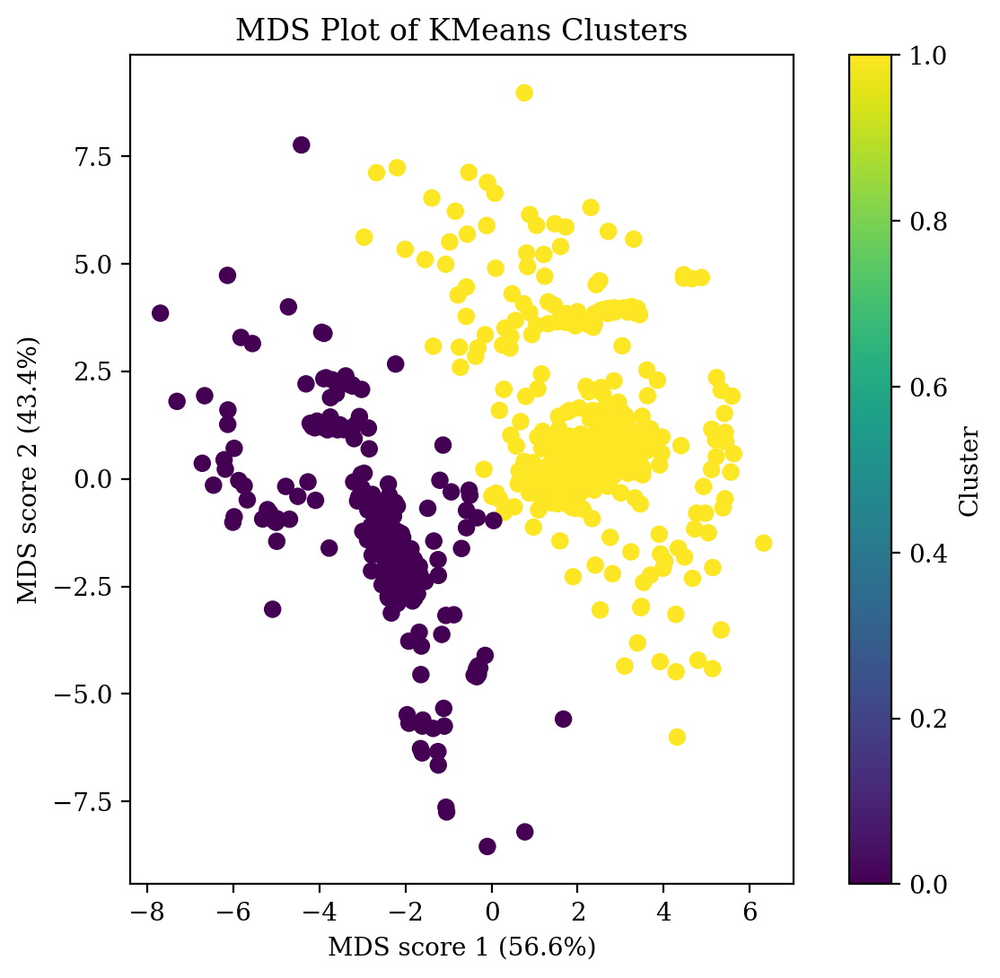

In [36]:



# Now we can perform KMeans clustering with 2 clusters (based on elbow and silhouette score)

kmeans = KMeans(n_clusters=2, random_state=10).fit(X_clr)
kmeans_label = kmeans.labels_

# Apply MDS to reduce the data to 2 dimensions

mds = MDS(n_components=2, random_state=10, dissimilarity='euclidean')
mds_coords = mds.fit_transform(X_clr)

# Compute singular values from MDS coordinates using SVD
s = np.linalg.svd(mds_coords, compute_uv=False)

# Plot MDS results colored by KMeans cluster labels
plt.figure(figsize=(8, 6))
plt.scatter(mds_coords[:, 0], mds_coords[:, 1], c=kmeans_label, cmap='viridis')
plt.xlabel('MDS score 1 ({:.1f}%)'.format(100 * s[0] / np.sum(s)))
plt.ylabel('MDS score 2 ({:.1f}%)'.format(100 * s[1] / np.sum(s)))
plt.title('MDS Plot of KMeans Clusters')
plt.gca().set(aspect='equal')  # Equal scaling on both axes
plt.colorbar(label='Cluster')
plt.show()

Elements found:
['Ca', 'As', 'Ag', 'Sb', 'Pb']


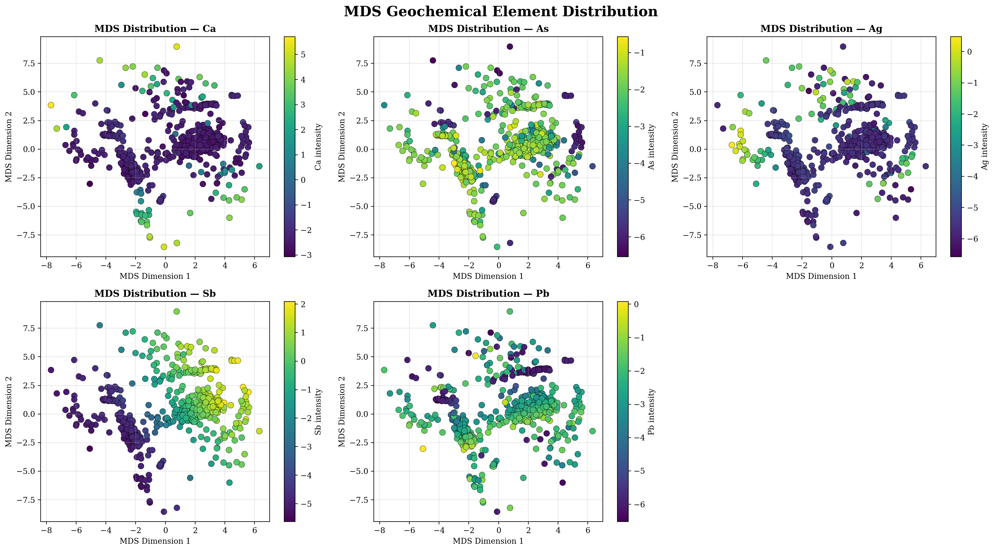

In [37]:
# ============================================================
# MDS VISUALIZATION — SAFE VERSION
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------
# Use ONLY elements actually found
# ------------------------------------------------------------

elements_found = []

for col in selected_cols:

    # Extract element name from clr(column)
    elem = col.replace('clr(', '').split('(')[0]

    elements_found.append(elem)

print("Elements found:")
print(elements_found)

# ------------------------------------------------------------
# Create subplot layout dynamically
# ------------------------------------------------------------

n_elements = len(elements_found)

fig, axes = plt.subplots(
    2,
    int(np.ceil(n_elements / 2)),
    figsize=(18, 10)
)

# Flatten axes safely
axes = np.array(axes).flatten()

# ------------------------------------------------------------
# Plot each element
# ------------------------------------------------------------

for i, elem in enumerate(elements_found):

    scatter = axes[i].scatter(
        mds_coords[:, 0],
        mds_coords[:, 1],
        c=X_clr[:, i],
        cmap='viridis',
        s=60,
        edgecolor='k',
        linewidth=0.3
    )

    cbar = plt.colorbar(
        scatter,
        ax=axes[i]
    )

    cbar.set_label(f'{elem} intensity')

    axes[i].set_title(
        f'MDS Distribution — {elem}',
        fontsize=12,
        fontweight='bold'
    )

    axes[i].set_xlabel(
        'MDS Dimension 1'
    )

    axes[i].set_ylabel(
        'MDS Dimension 2'
    )

    axes[i].grid(alpha=0.3)

# ------------------------------------------------------------
# Hide unused subplots
# ------------------------------------------------------------

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# ------------------------------------------------------------
# Final formatting
# ------------------------------------------------------------

plt.suptitle(
    'MDS Geochemical Element Distribution',
    fontsize=18,
    fontweight='bold'
)

plt.tight_layout()

plt.show()

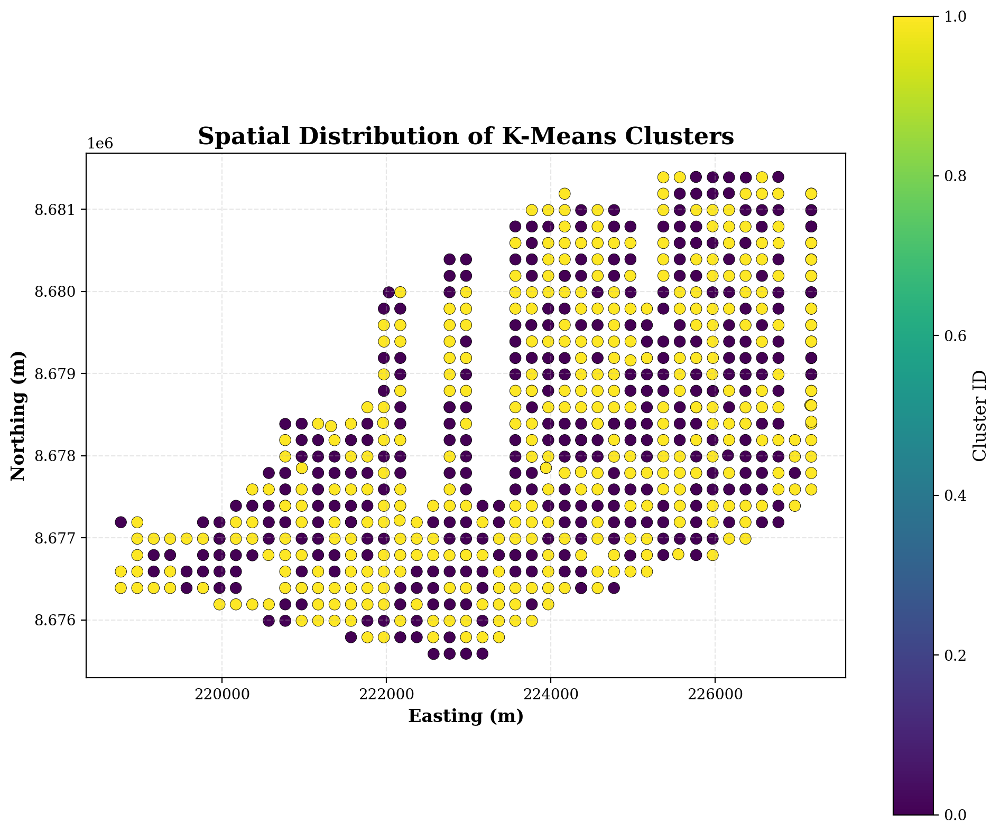

In [38]:
# ============================================================
# SPATIAL KMEANS CLUSTER MAP
# ============================================================

plt.figure(figsize=(10, 8))

scatter = plt.scatter(
    df['x'],
    df['y'],
    c=kmeans_label,
    cmap='viridis',
    s=60,
    edgecolor='black',
    linewidth=0.3
)

# ------------------------------------------------------------
# Colour bar
# ------------------------------------------------------------

cbar = plt.colorbar(scatter)

cbar.set_label(
    'Cluster ID',
    fontsize=12
)

# ------------------------------------------------------------
# Labels and styling
# ------------------------------------------------------------

plt.xlabel(
    'Easting (m)',
    fontsize=12,
    fontweight='bold'
)

plt.ylabel(
    'Northing (m)',
    fontsize=12,
    fontweight='bold'
)

plt.title(
    'Spatial Distribution of K-Means Clusters',
    fontsize=16,
    fontweight='bold'
)

plt.grid(
    alpha=0.3,
    linestyle='--'
)

plt.gca().set_aspect('equal')

plt.tight_layout()

plt.show()

From the spatial plot clusters are observed on the map giving us more insights on the distribution of the respective 6 elements we considered important for this analysis.

## Before proceeding to the other set of questions, I'll confirm if my CLR transformed df is up and running.

In [39]:
clr_df

,clr(Local Peg),clr(Depth),clr(Testing time),clr(Number of test points),clr(K(PPM)),clr(Ca(PPM)),clr(Ti(PPM)),clr(V(PPM)),clr(Cr(PPM)),clr(Mn(PPM)),...,clr(Rb(PPM)),clr(Sr(PPM)),clr(Y(PPM)),clr(Zr(PPM)),clr(Nb(PPM)),clr(Mo(PPM)),clr(Ag(PPM)),clr(Sn(PPM)),clr(Sb(PPM)),clr(Pb(PPM))
0,3.766198,-0.040465,-0.040465,-3.441662,5.556591,-2.361284,5.247541,0.909003,0.792012,1.987850,...,0.841759,-0.403709,-0.374326,1.956143,-0.426269,-2.852105,-5.618958,-1.088222,0.616604,-1.514733
1,3.586364,-0.219558,-0.219558,-3.620755,5.293064,-2.540377,5.048869,1.301064,0.739946,2.536775,...,0.664320,-0.333791,-0.527819,1.934597,-0.378147,-2.153692,-5.798051,-0.730383,-1.091250,-1.660824
2,3.583945,-0.221234,-0.221234,-3.622432,5.235126,0.633812,5.053236,1.047046,0.906905,2.627993,...,0.533522,-0.133376,-0.613551,1.918734,-0.423077,-5.632489,-5.799727,-1.094713,-0.514732,-1.882443
3,3.644772,-0.159666,-0.159666,-3.560863,4.362717,-2.480485,4.976482,0.952159,0.716576,2.515329,...,0.207225,-0.801132,-0.522833,2.238348,-0.256566,-1.700780,-0.675579,-0.786676,-5.038191,-2.424632
4,3.803008,-0.000687,-0.000687,-3.401885,4.963234,-2.321506,5.448399,1.333410,1.034841,3.135812,...,0.020755,-0.409869,-0.352204,2.405789,-0.095548,-4.823645,-5.579180,-0.603038,-4.879212,-0.796482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
712,3.641864,0.005156,0.005156,-3.396042,6.365900,-2.315663,5.340499,0.892645,1.061556,2.372895,...,1.139528,-0.457123,-0.161359,2.122455,-0.291666,0.475870,-5.573337,-0.308898,-4.873369,-3.691752
713,3.703102,0.067271,0.067271,-3.333926,5.991358,-2.253548,5.520899,1.205347,0.882282,1.749799,...,1.257096,-0.213236,0.025518,2.226086,-0.175833,-2.030962,-5.511222,-0.443554,-2.301645,-1.610231
714,3.304175,-0.330776,-0.330776,-3.731973,6.147334,-2.651595,5.497002,1.373778,0.223464,1.767438,...,0.752567,-0.307235,-0.493530,1.736378,-0.359192,-1.933097,-5.909269,-0.261122,1.187242,-1.956264
715,3.857021,0.222070,0.222070,-3.179127,6.192464,-2.098749,5.658449,0.655051,1.018285,2.188436,...,1.280000,0.404475,0.141799,2.355712,-0.191654,-0.895060,-5.356423,-0.296082,-4.656455,-5.890137




## This is Question Five. PCA (Principal Component Analysis)


In this question, we perform Principal Component Analysis (PCA) on compositional data that has already been transformed in question three using the Centered Log-Ratio (CLR) transformation.

Because compositional datasets are constrained, applying PCA directly to the raw or log-transformed data can produce misleading results. The CLR transformation maps the data point into a space where components are centered, but still lie in a constrained hyperplane.

- To perform PCA in a proper Euclidean space, we further transform the CLR data using the Isometric Log-Ratio (ILR) transformation. This is done as follows.

This clr-ilr transformation ensures:

- The ILR-transformed dataset lie in a true Euclidean space.This gets interesting because we don't need to standardize our irl data, It's alraedy in euclidean space.

- We can be confident that PCA assumptions are now valid

- Resulting principal components are interpretable and statistically sound

In [40]:
def ilr_clr(clr_df):
    D = clr_df.shape[1]
    V = np.zeros((D,D-1))
    for i in np.arange(1,D):
        V_i = np.zeros(D)
        V_i[:i] = 1/i
        V_i[i] = -1
        V_i = V_i*np.sqrt(i/(i+1))
        V[:,i-1] = V_i
    return V

In [41]:
V = ilr_clr(clr_df)

In [42]:
ilr_df = np.dot(clr_df,V)

In [43]:
ilr_df

array([[ 2.69171686,  1.55406345,  4.04441214, ...,  1.14732824,
        -0.56940284,  1.54358762],
       [ 2.69119288,  1.55376094,  4.04419823, ...,  0.85779715,
         1.17800381,  1.69246177],
       [ 2.69066852,  1.55345819,  4.04398416, ...,  1.21515113,
         0.59876153,  1.91830179],
       ...,
       [ 2.57029858,  1.48396258,  3.99484334, ...,  0.29790195,
        -1.13402326,  1.99352975],
       [ 2.57029858,  1.48396258,  3.99484334, ...,  0.73275068,
         4.9797012 ,  6.00234045],
       [ 2.60902069,  1.5063188 ,  4.01065157, ...,  1.09293045,
         4.08251443,  1.63647848]])

In [44]:
# Here we Run PCA
X = ilr_df
n_pcs = X.shape[1]
pca = PCA(n_components=n_pcs)
pca.fit(X)
X_pc = pca.transform(X)

The principal components obtained from PCA in ILR space can be transformed back into the CLR space for easier interpretation. While ILR is optimal for computation and preserving Euclidean structure, CLR is often more intuitive when interpreting loadings in terms of original compositional parts.

In [45]:
pca_components_clr_space = np.dot(pca.components_,V.T) # from ilr to clr space

So, to reduce dimensionality while retaining key information, we apply PCA to capture 86% of the total variance. This helps identify the most important principal components (PCs) that explain patterns in the data.

After transformation, we convert the PCA scores into a DataFrame for better readability and examine the explained variance ratio.

In [46]:
# Fit PCA with goal of explaining 96% of the variance
pca = PCA(n_components=0.86)
scores = pca.fit_transform(ilr_df)  # Use ILR-transformed data directly

# Convert PCA scores to a DataFrame for readability
pc_columns = [f'PC{i+1}' for i in range(scores.shape[1])]
pca_df = pd.DataFrame(scores, columns=pc_columns)

# Display the first few rows of the PCA scores
print(pca_df.head())

# Display the explained variance ratio
print("Explained Variance Ratio by PCs:", pca.explained_variance_ratio_)
print("Total Variance Explained:", sum(pca.explained_variance_ratio_))

        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -2.662678 -0.102886  0.966421  0.932625 -0.665347 -0.172460  0.287622   
1 -0.888224 -1.060800  0.297429  1.053571 -1.023785  0.007411  0.372330   
2 -1.564166 -1.484078  3.890422 -1.152289  0.950487 -0.047365 -0.344514   
3  3.117685 -0.630400 -0.996689  0.110078 -0.117420 -4.253719 -1.486418   
4  3.011998 -1.534224  2.997286  1.697214  0.233455 -0.570145  0.322775   

        PC8  
0  0.399082  
1  0.339245  
2  0.961956  
3 -0.713995  
4  0.500475  
Explained Variance Ratio by PCs: [0.28750671 0.11363346 0.10244816 0.0997543  0.08312726 0.07675657
 0.06390341 0.05343741]
Total Variance Explained: 0.8805672694650025


 The first few PCs account for most of the variance with PC1 capturing 47.78%, allowing us to focus only on the most informative components.

Now, we visualize the variance distribution using a scree plot to confirm how many PCs should be retained.

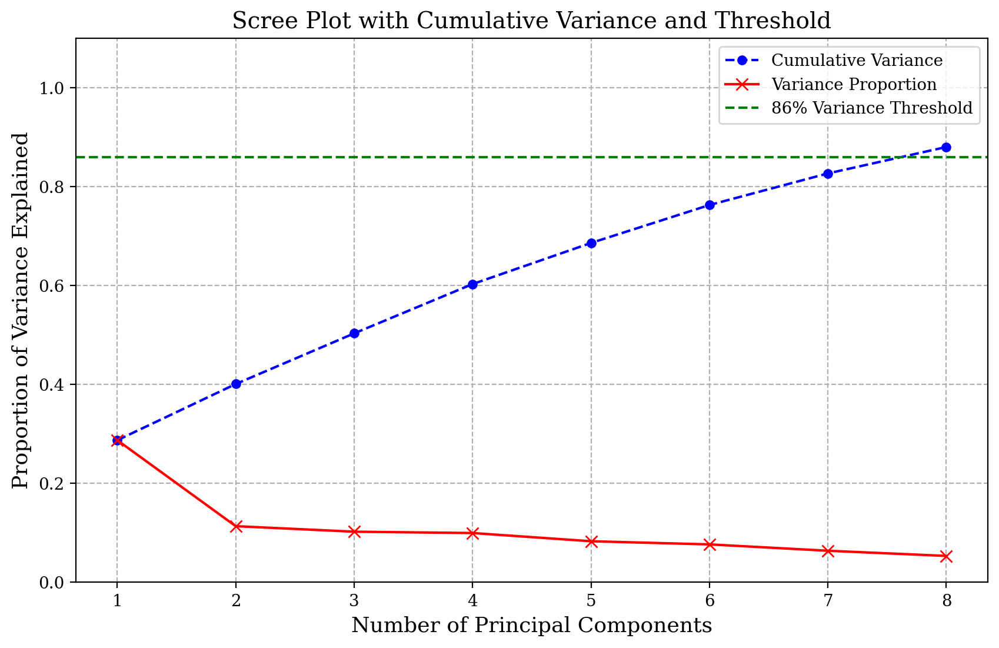

In [47]:
plt.figure(figsize=(10, 6))

# Cumulative variance (dashed line)
plt.plot(np.arange(1, pca.n_components_ + 1), pca.explained_variance_ratio_.cumsum(),
         marker='o', markersize=5, linestyle='dashed', color='blue', label='Cumulative Variance')

# Individual variance (solid line)
plt.plot(np.arange(1, pca.n_components_ + 1), pca.explained_variance_ratio_,
         marker='x', markersize=7, color='red', label='Variance Proportion')

# Here we add a horizontal line for our 86% cumulative variance threshold
plt.axhline(y=0.86, color='green', linestyle='--', label='86% Variance Threshold')

# Then plot
plt.xlabel('Number of Principal Components', fontsize=13)
plt.ylabel('Proportion of Variance Explained', fontsize=13)
plt.xticks(np.arange(1, pca.n_components_ + 1, 1))
plt.ylim(0, 1.1)
plt.legend()
plt.title('Scree Plot with Cumulative Variance and Threshold', fontsize=14)
plt.grid(True, linestyle='dashed')

plt.show()

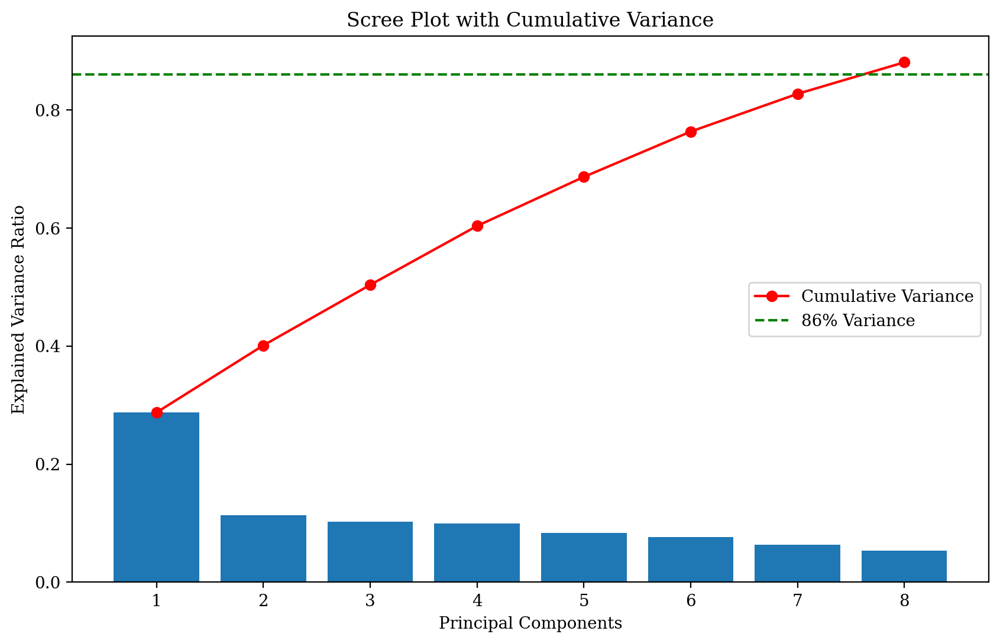

In [48]:
plt.figure(figsize=(10,6))
# This bar plot is for explained variance ratio
plt.bar(range(1, pca.n_components_+1), pca.explained_variance_ratio_)
# This is for the cumulative variance plot
plt.plot(range(1, pca.n_components_+1),
         np.cumsum(pca.explained_variance_ratio_), 'ro-', label='Cumulative Variance')
# The threshold line is set for 86% variance retention
plt.axhline(0.86, color='green', linestyle='--', label='86% Variance')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Scree Plot with Cumulative Variance')
plt.legend()
plt.show()

- Both scree plots provide valuable insights for determining the optimal number of principal components. The plot with bars visually emphasizes the individual variance explained by each component, revealing a steep decline after the first few PCs.

- Score Plots: Using Ag as color in the score plot

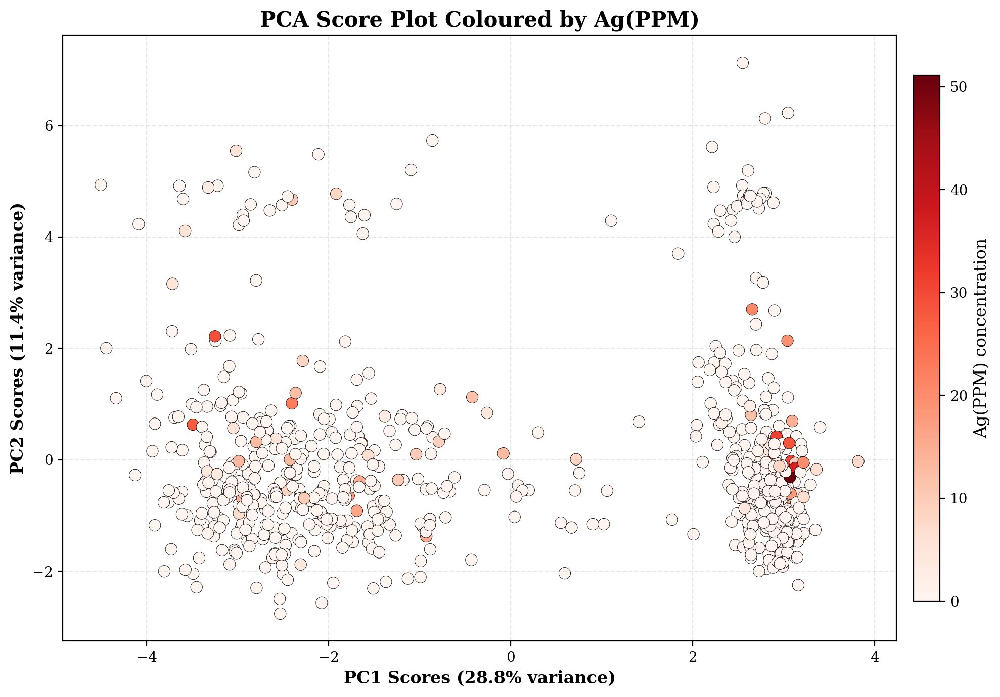

In [49]:
# ============================================================
# PCA SCORE PLOT COLOURED BY Ag
# ============================================================

import matplotlib.pyplot as plt

# ------------------------------------------------------------
# Choose actual Ag column name
# ------------------------------------------------------------

color_name = 'Ag(PPM)'   # CHANGE if needed

# ------------------------------------------------------------
# Create figure
# ------------------------------------------------------------

plt.figure(figsize=(10, 7))

scatter = plt.scatter(
    scores[:, 0],
    scores[:, 1],
    c=df[color_name],
    cmap='Reds',
    s=70,
    edgecolor='black',
    linewidth=0.3
)

# ------------------------------------------------------------
# Colour bar
# ------------------------------------------------------------

cbar = plt.colorbar(
    scatter,
    fraction=0.03,
    pad=0.02
)

cbar.set_label(
    f'{color_name} concentration',
    fontsize=12
)

# ------------------------------------------------------------
# Axis labels
# ------------------------------------------------------------

plt.xlabel(
    'PC1 Scores ({:.1f}% variance)'.format(
        100 * pca.explained_variance_ratio_[0]
    ),
    fontsize=12,
    fontweight='bold'
)

plt.ylabel(
    'PC2 Scores ({:.1f}% variance)'.format(
        100 * pca.explained_variance_ratio_[1]
    ),
    fontsize=12,
    fontweight='bold'
)

# ------------------------------------------------------------
# Title
# ------------------------------------------------------------

plt.title(
    f'PCA Score Plot Coloured by {color_name}',
    fontsize=15,
    fontweight='bold'
)

# ------------------------------------------------------------
# Styling
# ------------------------------------------------------------

plt.grid(
    alpha=0.3,
    linestyle='--'
)

plt.tight_layout()

plt.show()

- Score Plot Of What Considered As An Important Log-Ratio.

Ag column: Ag(PPM)
Ca column: Ca(PPM)


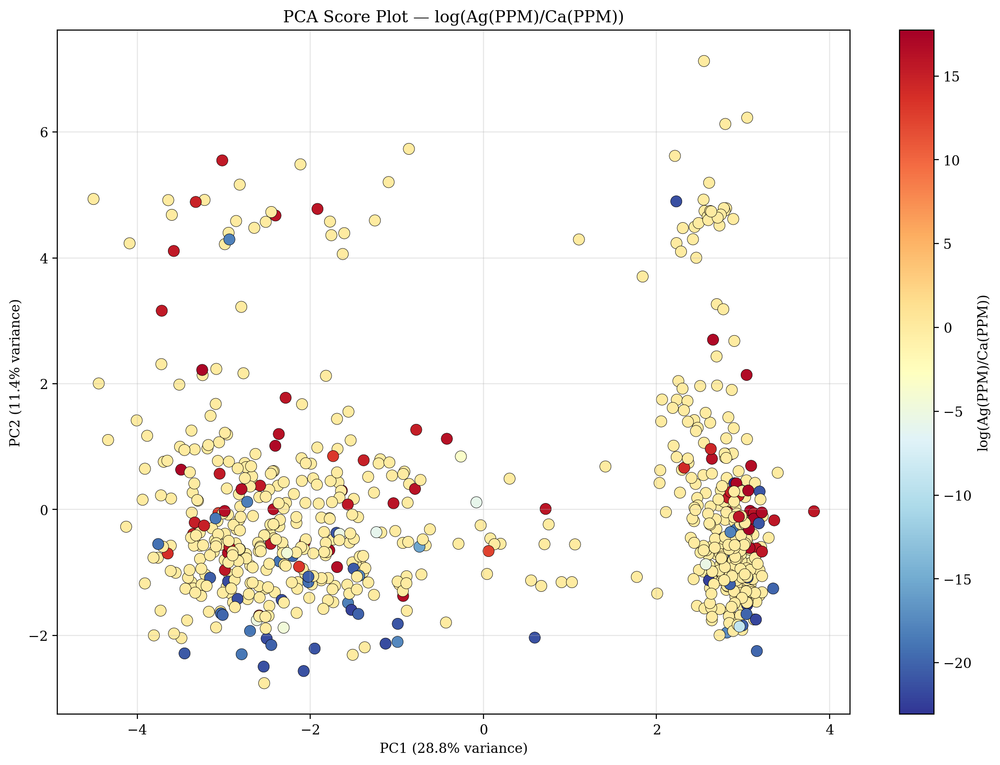

In [50]:
# ============================================================
# AUTOMATIC Ag/Ca COLUMN DETECTION
# ============================================================

ag_col = [c for c in df.columns if 'Ag' in c][0]
ca_col = [c for c in df.columns if 'Ca' in c][0]

print("Ag column:", ag_col)
print("Ca column:", ca_col)

# ------------------------------------------------------------
# SAFE LOG RATIO
# ------------------------------------------------------------

epsilon = 1e-6

log_ratio = np.log(
    (df[ag_col] + epsilon) /
    (df[ca_col] + epsilon)
)

# ------------------------------------------------------------
# PCA PLOT
# ------------------------------------------------------------

plt.figure(figsize=(11, 8))

scatter = plt.scatter(
    scores[:, 0],
    scores[:, 1],
    c=log_ratio,
    cmap='RdYlBu_r',
    s=70,
    edgecolor='black',
    linewidth=0.3
)

cbar = plt.colorbar(scatter)

cbar.set_label(
    f'log({ag_col}/{ca_col})'
)

plt.xlabel(
    'PC1 ({:.1f}% variance)'.format(
        100 * pca.explained_variance_ratio_[0]
    )
)

plt.ylabel(
    'PC2 ({:.1f}% variance)'.format(
        100 * pca.explained_variance_ratio_[1]
    )
)

plt.title(
    f'PCA Score Plot — log({ag_col}/{ca_col})'
)

plt.grid(alpha=0.3)

plt.tight_layout()

plt.show()

### Plotting the Loadings

The PCA loadings represent how strongly each original variable contributes to the principal components (PCs). By plotting the loadings for the first four PCs, we can identify which elements influence each component the most. This helps in understanding the geochemical variations in the dataset.

ILR dataframe shape: (717, 26)
Columns used: ['Au', 'Ag', 'As', 'Ba', 'Be', 'Bi', 'Cd', 'Co', 'Cr', 'Cu', 'Mn', 'Nb', 'Ni', 'P', 'Pb', 'Rb', 'Sb', 'Sn', 'Ti', 'V', 'W', 'Zn', 'Zr', 'Si', 'Al', 'Fe']


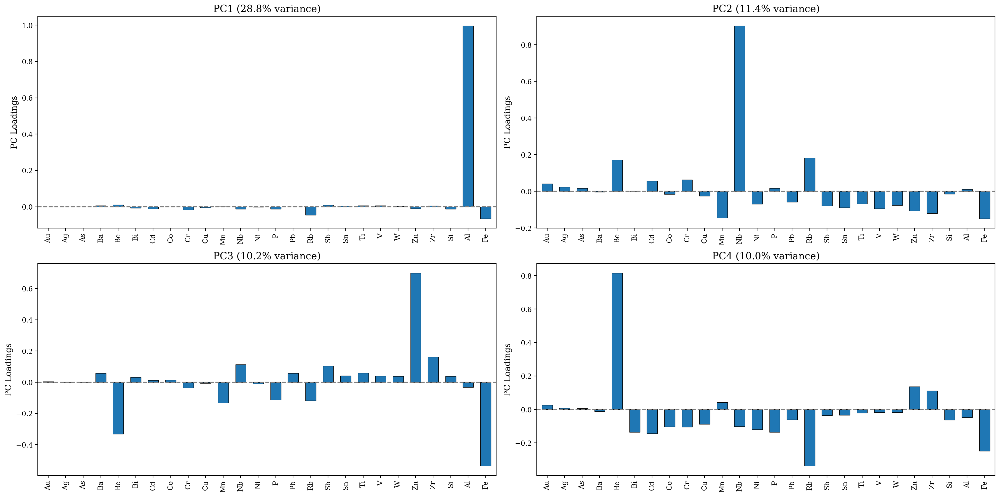

In [51]:
# ============================================================
# Create correct column names for ILR dataframe
# ============================================================

# Original full element list
elements = ['Au', 'Ag', 'As', 'Ba', 'Be', 'Bi', 'Cd', 'Co', 'Cr', 'Cu',
            'Mn', 'Nb', 'Ni', 'P', 'Pb', 'Rb', 'Sb', 'Sn', 'Ti', 'V',
            'W', 'Zn', 'Zr', 'Si', 'Al', 'Fe', 'Mg', 'Ca', 'Na', 'K']

# Match number of columns to ILR matrix
elements_used = elements[:ilr_df.shape[1]]

# Create dataframe
ilr_df = pd.DataFrame(ilr_df, columns=elements_used)

print("ILR dataframe shape:", ilr_df.shape)
print("Columns used:", ilr_df.columns.tolist())

# ============================================================
# PCA Loadings Plot
# ============================================================

plt.figure(figsize=(20, 10))

n_pcs = min(4, pca.components_.shape[0])

for i in range(n_pcs):

    plt.subplot(2, 2, i + 1)

    loadings = pca.components_[i, :len(ilr_df.columns)]

    plt.bar(
        ilr_df.columns,
        loadings,
        edgecolor='black',
        linewidth=0.5,
        width=0.6
    )

    plt.axhline(0, color='grey', linestyle='--')

    plt.ylabel('PC Loadings', fontsize=12)

    plt.xticks(rotation=90, fontsize=10)

    plt.title(
        f'PC{i+1} '
        f'({100 * pca.explained_variance_ratio_[i]:.1f}% variance)',
        fontsize=14
    )

    plt.xlim(-0.6, len(ilr_df.columns) - 0.4)

plt.tight_layout()
plt.show()

We have no (K) because ILR transformation reduces the clr dataset to 29 columns because compositional data lie on a (D−1) dimensional simplex

- PC1: This component explains the largest proportion of the total variance notably, elements like Magnesium (Mg) have high positive loadings. for the negative loadings, they seem fairly distributed.

- PC2: As the second most significant component, PC2 captures the next major pattern of variation. Here, both Magnesium (Mg) and Calcium (Ca) exhibit high positive loadings. with (As) and (Pb) exhibiting the highest negative loading values.


- PC3: This component is particularly significant from an exploration perspective. It displays strong positive loadings for Gold (Au) and Silver (Ag). This clear co-variation indicates that PC3 is likely a direct indicator of the gold-silver mineralization signature within the dataset. Also the observed high negative loadings include (Sn) and (Zn). Areas with high PC3 scores are characterized by elevated concentrations of these precious metals, highlighting potential mineralized zones.

- PC4: The fourth principal component reveals another distinct elemental association, with strong positive loadings for Antimony (Sb), Zinc (Zn), and Calcium (Ca). This pattern suggests a separate geochemical process or alteration style characterized by the co-enrichment of Sb and Zn.


- Spatial Plot

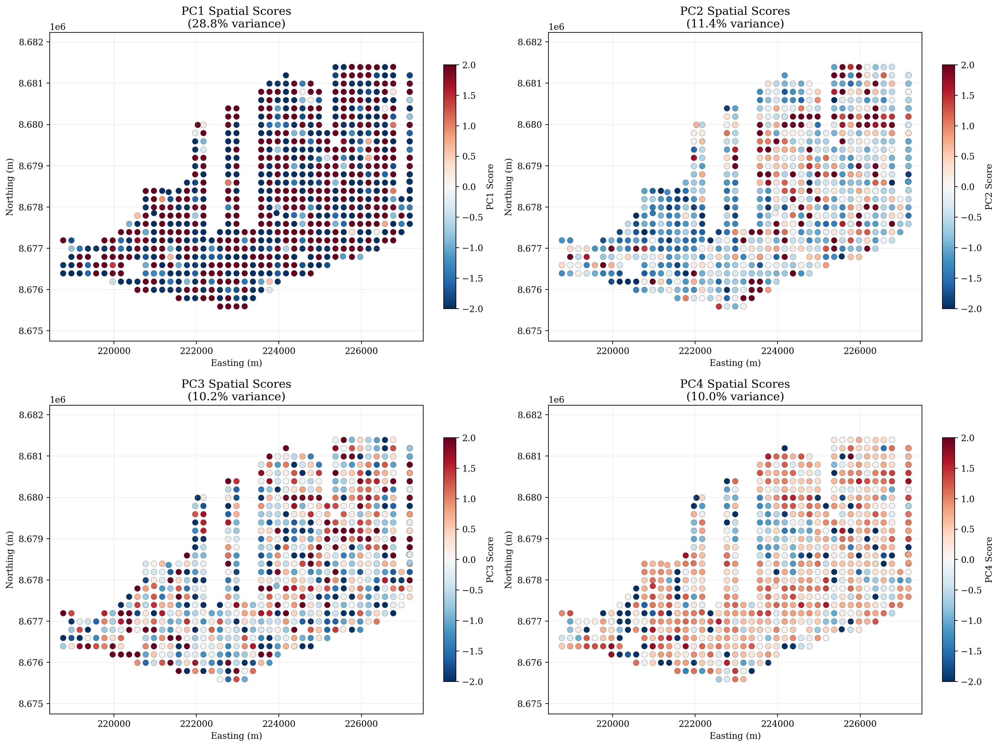

In [53]:
# ============================================================
# Spatial PCA Score Maps
# ============================================================

plt.figure(figsize=(16, 12))

# Plot first 4 PCs
n_pcs = min(4, scores.shape[1])

for i in range(n_pcs):

    plt.subplot(2, 2, i + 1)

    scatter = plt.scatter(
        df['x'],
        df['y'],
        c=scores[:, i],
        cmap='RdBu_r',
        edgecolor='black',
        linewidth=0.15,
        s=45,
        vmin=-2,
        vmax=2
    )

    # Colorbar
    cbar = plt.colorbar(scatter, fraction=0.03)
    cbar.set_label(f'PC{i+1} Score')

    # Titles
    plt.title(
        f'PC{i+1} Spatial Scores\n'
        f'({100 * pca.explained_variance_ratio_[i]:.1f}% variance)',
        fontsize=13
    )

    plt.xlabel('Easting (m)')
    plt.ylabel('Northing (m)')

    # Equal scaling for real spatial geometry
    plt.axis('equal')

    # Light grid
    plt.grid(alpha=0.2)

plt.tight_layout()
plt.show()

Yes, based on the visual comparison of the PC score spatial plots with the geological map, there is clear spatial correlation for both the first and second principal components however, i can observe more clear correlation with the second PC. The patterns of high and low PC scores are not randomly distributed but instead show distinct alignments with specific geological units and possibly structural features depicted on the map like the blues and reds being aligned together, in the second PCthe blues are more on the bottom side of the spatial map and the reds more at the top. This indicates that the main sources of geochemical variation captured by PC1 and PC2 are directly related to the underlying geology of the study area.

# This is Question Six: FA (Factor Analysis)

Here we perform Factor Analysis (FA) on the compositional dataset to identify latent factors that explain the observed variance in the elemental compositions. Following the standard protocol for compositional data analysis, FA was applied to the Isometric Log-Ratio (ILR) transformed data to ensure analysis in a Euclidean space. The ILR transformation (ilr_df) was derived from the Centered Log-Ratio (CLR) transformed data as previously described. The ILR data was then scaled using StandardScaler (X_scaler) before applying FA

In [54]:
X = ilr_df.values
scaler = StandardScaler()
X_scaler = scaler.fit_transform(X)

- Factor Analysis assuming three underlying factors,

In [55]:
from factor_analyzer import FactorAnalyzer

fa3 = FactorAnalyzer(n_factors=3, rotation='varimax', method='minres')
fa3.fit(X_scaler)
X_fa3 = fa3.transform(X_scaler)


var_exp_3 = np.sum(fa3.loadings_**2, axis=0) / X.shape[1]

# Loadings in clr space
loadings_clr_3 = np.dot(fa3.loadings_.T, V.T)

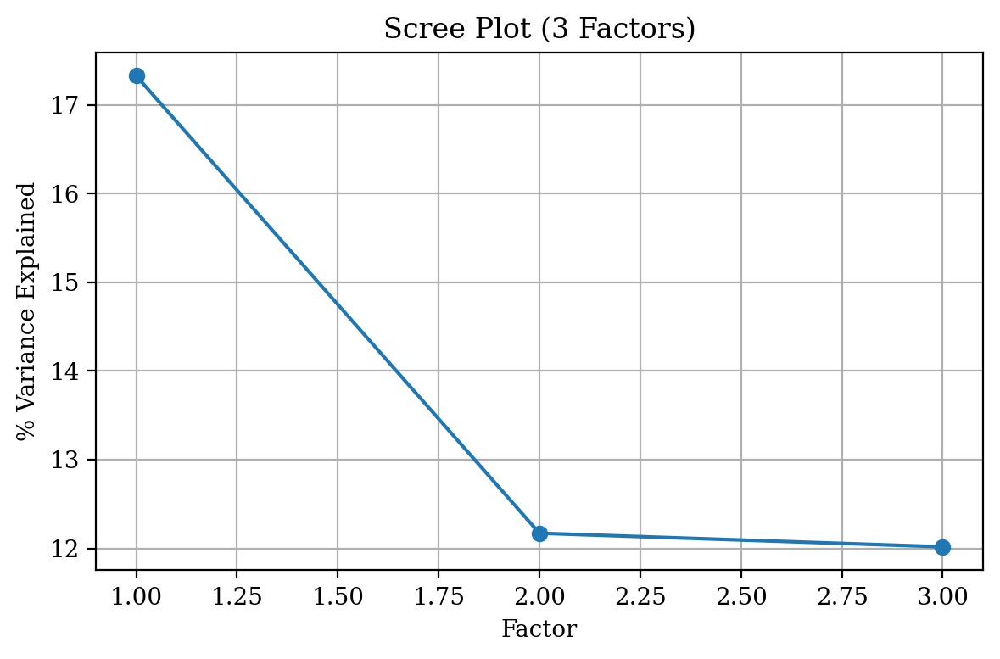

In [56]:

def plot_scree(fa, title):
    ev, v, _ = fa.get_factor_variance()
    plt.figure(figsize=(6,4))
    plt.plot(range(1, len(v)+1), v * 100, marker='o')
    plt.xlabel('Factor')
    plt.ylabel('% Variance Explained')
    plt.title(title)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plot_scree(fa3, "Scree Plot (3 Factors)")

- The scree plot for the 3-factor model shows the percentage of variance explained by each factor. We observe a relatively steep drop in explained variance after the first few factors, suggesting that a small number of factors capture a significant portion of the total variance. This is interesting observation.

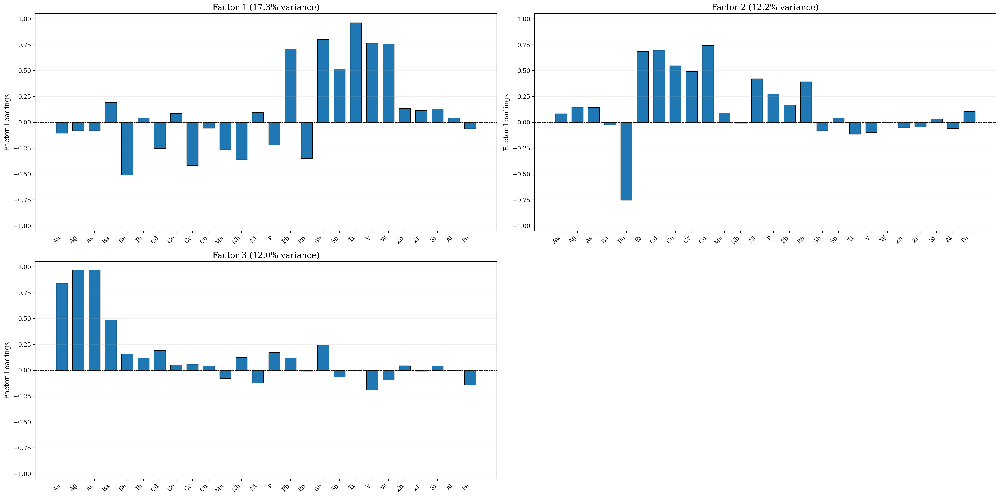

In [57]:
# ============================================================
# Factor Analysis Loadings Plot
# ============================================================

plt.figure(figsize=(24, 12))

# Original element list
elements = ['Au', 'Ag', 'As', 'Ba', 'Be', 'Bi', 'Cd', 'Co', 'Cr', 'Cu',
            'Mn', 'Nb', 'Ni', 'P', 'Pb', 'Rb', 'Sb', 'Sn', 'Ti', 'V',
            'W', 'Zn', 'Zr', 'Si', 'Al', 'Fe', 'Mg', 'Ca', 'Na', 'K']

# Match actual FA dimensions
elements_used = elements[:fa3.loadings_.shape[0]]

# Number of factors available
n_factors = min(4, fa3.loadings_.shape[1])

for i in range(n_factors):

    plt.subplot(2, 2, i + 1)

    # Factor loadings
    loadings = fa3.loadings_[:, i]

    # Bar plot
    plt.bar(
        elements_used,
        loadings,
        edgecolor='black',
        linewidth=0.5,
        width=0.7
    )

    # Zero reference line
    plt.axhline(
        y=0,
        color='black',
        linestyle='--',
        linewidth=0.8
    )

    # Labels
    plt.ylabel('Factor Loadings', fontsize=12)

    plt.xticks(
        rotation=45,
        fontsize=10,
        ha='right'
    )

    # Title
    plt.title(
        f'Factor {i+1} '
        f'({var_exp_3[i] * 100:.1f}% variance)',
        fontsize=14
    )

    plt.ylim(-1.05, 1.05)

    # Light grid
    plt.grid(alpha=0.2, axis='y')

plt.tight_layout()
plt.show()

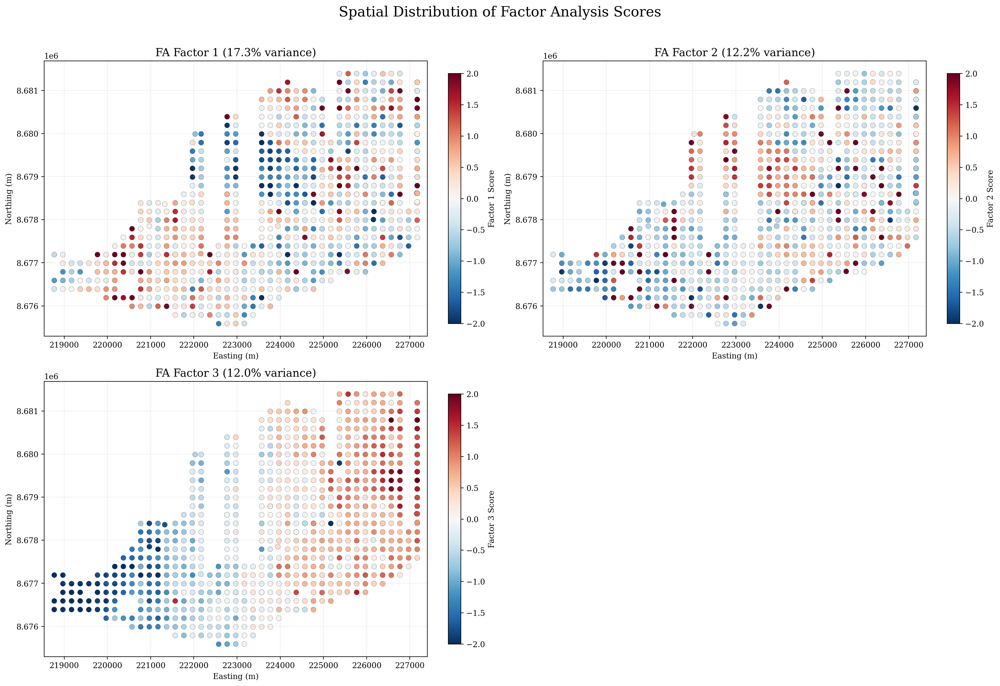

In [58]:
# ============================================================
# 3-Factor FA Spatial Score Maps
# ============================================================

plt.figure(figsize=(18, 12))

# Number of factors available
n_factors = min(3, X_fa3.shape[1])

for i in range(n_factors):

    plt.subplot(2, 2, i + 1)

    scatter = plt.scatter(
        df['x'],
        df['y'],
        c=X_fa3[:, i],
        cmap='RdBu_r',
        s=45,
        edgecolor='black',
        linewidth=0.15,
        vmin=-2,
        vmax=2
    )

    # Colorbar
    cbar = plt.colorbar(scatter, fraction=0.03)
    cbar.set_label(f'Factor {i+1} Score')

    # Titles
    plt.title(
        f'FA Factor {i+1} '
        f'({100 * var_exp_3[i]:.1f}% variance)',
        fontsize=14
    )

    # Axes labels
    plt.xlabel('Easting (m)')
    plt.ylabel('Northing (m)')

    # Equal spatial scaling
    plt.axis('equal')

    # Light grid
    plt.grid(alpha=0.2)

# Main title
plt.suptitle(
    'Spatial Distribution of Factor Analysis Scores',
    fontsize=18,
    y=1.02
)

plt.tight_layout()
plt.show()

- In this analysis, Factor Analysis (FA) is applied to compositional geochemical data to uncover underlying geochemical processes influencing mineral distribution. First we made an assumption of three factors and extracted the corresponding loadings and scores.

- The loadings showed which elements were most associated with each factor ,high positive loadings indicated elements enriched by a given process, while high negative loadings pointed to elements that were depleted. For example, from the loadings plots:

- Factor 1 is strongly associated with Mn, Pb, Si, and Sn (positively), and negatively with Cr and Mg, suggesting a geochemical signature possibly linked to specific lithologies or alteration zones.

- Factor 2 showed high positive associations with P, Pb, and Ca, and negative loadings for elements like Nb and Al, potentially indicating phosphate-related mineralization.

- Factor 3 had strong positive associations with Au, Cu, Ag, and Ba, while Mg was strongly negative—clearly highlighting zones of potential precious metal mineralization.



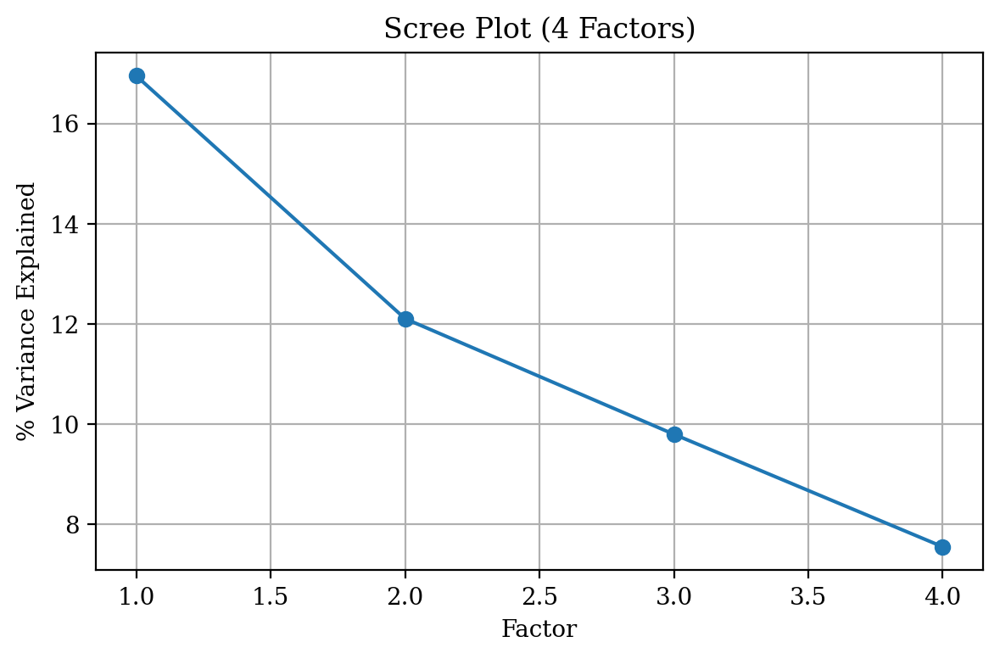

In [59]:
from factor_analyzer import FactorAnalyzer

fa4 = FactorAnalyzer(n_factors=4, rotation='varimax', method='minres')
fa4.fit(X_scaler)
X_fa4 = fa4.transform(X_scaler)
var_exp_4 = np.sum(fa4.loadings_**2, axis=0) / X.shape[1]
loadings_clr_4 = np.dot(fa4.loadings_.T, V.T)

plot_scree(fa4, "Scree Plot (4 Factors)")

- The "elbow" in the plot, where the curve significantly flattens, suggests that factors before this point capture most of the meaningful variance. Her we observe an elbow at a value of 2 on the scree plot indicating that the first two factors explain the majority of the data's variability.

Number of FA variables: 26
Number of labels: 26


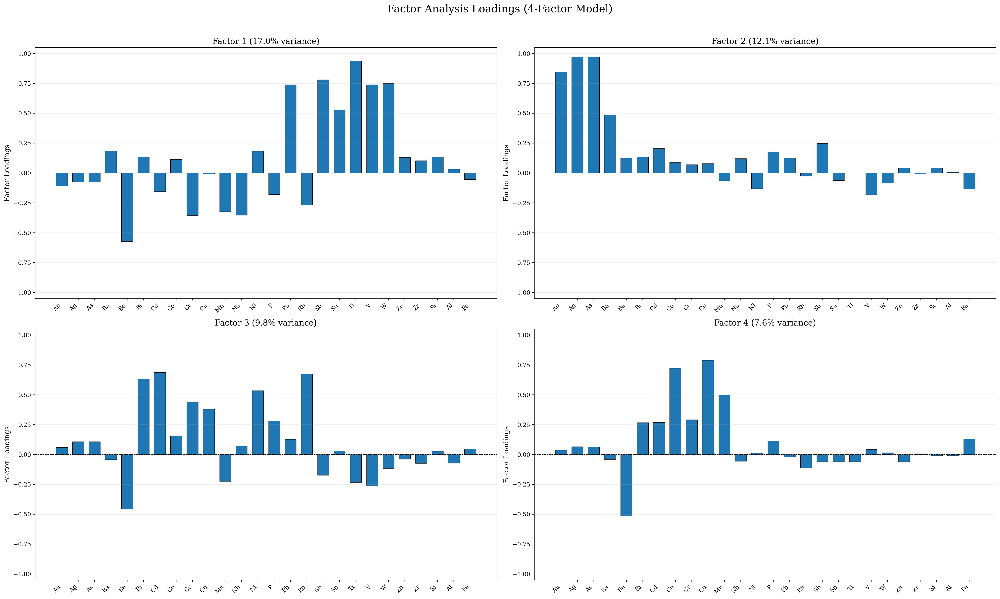

In [60]:
# ============================================================
# 4-Factor Analysis Loadings Plot
# ============================================================

plt.figure(figsize=(24, 14))

# Full original element list
elements = ['Au', 'Ag', 'As', 'Ba', 'Be', 'Bi', 'Cd', 'Co', 'Cr', 'Cu',
            'Mn', 'Nb', 'Ni', 'P', 'Pb', 'Rb', 'Sb', 'Sn', 'Ti', 'V',
            'W', 'Zn', 'Zr', 'Si', 'Al', 'Fe', 'Mg', 'Ca', 'Na', 'K']

# Match actual FA dimensions
elements_used = elements[:fa4.loadings_.shape[0]]

print("Number of FA variables:", fa4.loadings_.shape[0])
print("Number of labels:", len(elements_used))

# Plot factors
n_factors = min(4, fa4.loadings_.shape[1])

for i in range(n_factors):

    plt.subplot(2, 2, i + 1)

    loadings = fa4.loadings_[:, i]

    plt.bar(
        elements_used,
        loadings,
        edgecolor='black',
        linewidth=0.5,
        width=0.7
    )

    # Zero line
    plt.axhline(
        y=0,
        color='black',
        linestyle='--',
        linewidth=0.8
    )

    # Labels
    plt.ylabel('Factor Loadings', fontsize=12)

    plt.xticks(
        rotation=45,
        fontsize=10,
        ha='right'
    )

    # Title
    plt.title(
        f'Factor {i+1} '
        f'({var_exp_4[i] * 100:.1f}% variance)',
        fontsize=14
    )

    plt.ylim(-1.05, 1.05)

    # Light grid
    plt.grid(alpha=0.2, axis='y')

plt.suptitle(
    'Factor Analysis Loadings (4-Factor Model)',
    fontsize=18,
    y=1.02
)

plt.tight_layout()
plt.show()

- Factor 1: Seems to represent a group of elements (Au, As, Ba, P, Pb, Zr, Si, Ca, Na) that are enriched together, while Nb is depleted. This could relate to a specific lithological unit, alteration type, or mineralization style.

- Factor 2: Shows a positive association between Cd, Co, Cu, Ti, and Al, and a negative association with P and Ca.
- Factor 3: Groups Be, Bi, Cr, and W positively, and Mn, Sn, and Zn negatively.

- Factor 4: Highlights a positive association between Be and V, and a negative association with Fe and Mg.

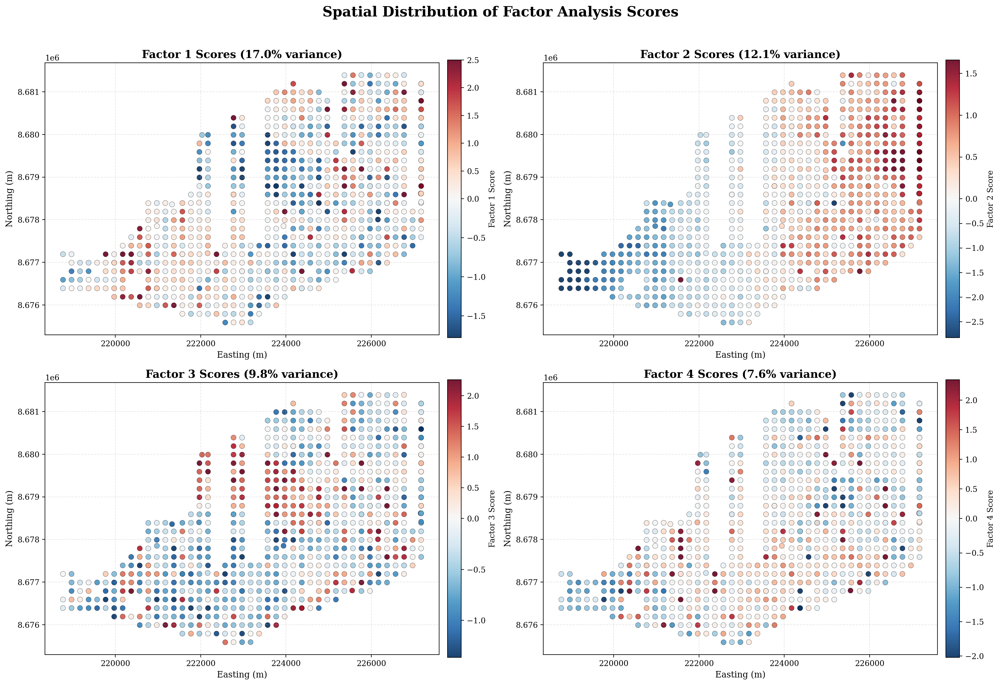

In [61]:
# ============================================================
# FACTOR SCORE MAPS — PROFESSIONAL GEOLOGICAL STYLE
# ============================================================

import matplotlib.pyplot as plt
import matplotlib.colors as colors

# ------------------------------------------------------------
# Create figure
# ------------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
axes = axes.flatten()

# ------------------------------------------------------------
# Plot each factor
# ------------------------------------------------------------
for i in range(4):

    ax = axes[i]

    scatter = ax.scatter(
        df['x'],                    # USE df NOT data
        df['y'],
        c=X_fa4[:, i],
        cmap='RdBu_r',
        s=45,
        edgecolor='black',
        linewidth=0.25,
        alpha=0.9,

        # Better colour normalization
        norm=colors.TwoSlopeNorm(
            vmin=np.percentile(X_fa4[:, i], 2),
            vcenter=0,
            vmax=np.percentile(X_fa4[:, i], 98)
        )
    )

    # --------------------------------------------------------
    # Titles and labels
    # --------------------------------------------------------
    ax.set_title(
        f'Factor {i+1} Scores '
        f'({100 * var_exp_4[i]:.1f}% variance)',
        fontsize=14,
        fontweight='bold'
    )

    ax.set_xlabel('Easting (m)', fontsize=11)
    ax.set_ylabel('Northing (m)', fontsize=11)

    # Geological map appearance
    ax.set_aspect('equal')
    ax.grid(True, linestyle='--', alpha=0.3)

    # --------------------------------------------------------
    # Colour bar
    # --------------------------------------------------------
    cbar = plt.colorbar(
        scatter,
        ax=ax,
        fraction=0.035,
        pad=0.02
    )

    cbar.set_label(
        f'Factor {i+1} Score',
        fontsize=10
    )

# ------------------------------------------------------------
# Main title
# ------------------------------------------------------------
plt.suptitle(
    'Spatial Distribution of Factor Analysis Scores',
    fontsize=18,
    fontweight='bold',
    y=1.02
)

plt.tight_layout()

# Optional save
# plt.savefig('FA4_score_maps.png', dpi=300, bbox_inches='tight')

plt.show()

- Factor analysis showed more insights in the data like the clear clusters in our spartial maps as compared to PCA. The FA with four factors had some consistency in the data distribution in the first spartial maps for the first factor.

## This Is Question Seven


a) Assuming 3 factors,

- Factor 3 is the most interesting because it shows high positive loadings for gold (Au), copper (Cu), silver (Ag), and barium (Ba), with a strong negative loading for magnesium (Mg). These elements are typically associated with hydrothermal mineralization.

b)

- Yes, there is a strong overlap between areas with high Factor 3 scores and the geological units shown on the map. These zones mostly fall within the Jurassic and Devonian volcaniclastic formations, and they are located near NE-trending faults and granitic intrusions. This alignment supports the idea that the geochemical patterns are controlled by both the type of rock and the regional geological structures that could host mineral deposits.

c)

- The first drill site would be in the northeastern zone, where Factor 3 scores are highest and geological conditions are favorable due to the presence of faults and nearby granitic intrusions. The second drill site would be at the intersection of NE and NW a trending faults in the central part of the study area, where moderate Factor 3 values suggest upward movement of mineralization. The third drill site would be in the southeast near the edge of the Jurassic unit, where Cu and Ba values are elevated, possibly indicating a distal part of the mineralized system.



## This Is Question 8

After carefully performing data analysis on the dataset, we found a pattern that points to areas where valuable metals like gold, silver, and copper are likely concentrated beneath the surface. These areas line up well with certain rock types and fault lines shown on the geological map, suggesting the minerals are linked to natural processes involving underground heat and fluid movement. Based on this, we recommend drilling deeper wells in three locations: first, in the northeast where the strongest signs of mineralization appear near granite formations and faults; second, near the center where different fault lines meet, which could be pathways for mineral-rich fluids; and third, in the southeast where some metals are found, possibly indicating the outer edges of the mineral deposit. This targeted approach will help uncover valuable mineral resources hidden beneath.

### References

Notebooks

- Central Valley EDA, Biplot, Outlier Detection, Cluster Analysis, PCA Protocol, Factor Analysis Protocol, and Factor Analysis in Central Valley